# 2216 - Assignment Title

Start by making the required imports

In [1]:

from sklearn.model_selection import GridSearchCV
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier

import numpy as np
import os
from tensorflow.keras.models import Sequential,load_model
from tensorflow.keras.layers import Dense,Dropout
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint
from tensorflow.keras.initializers import HeNormal, HeUniform
import tensorflow as tf
tf.get_logger().setLevel('ERROR')
# tf.autograph.set_verbosity(0)

import matplotlib.pyplot as plt
plt.rcParams['font.size'] = 14



# from scikeras.wrappers import KerasClassifier, KerasRegressor
# random seed for reproducibility
np.random.seed(12345)
# Keep a 2D through the nootbook
L = 2


## Creating the data



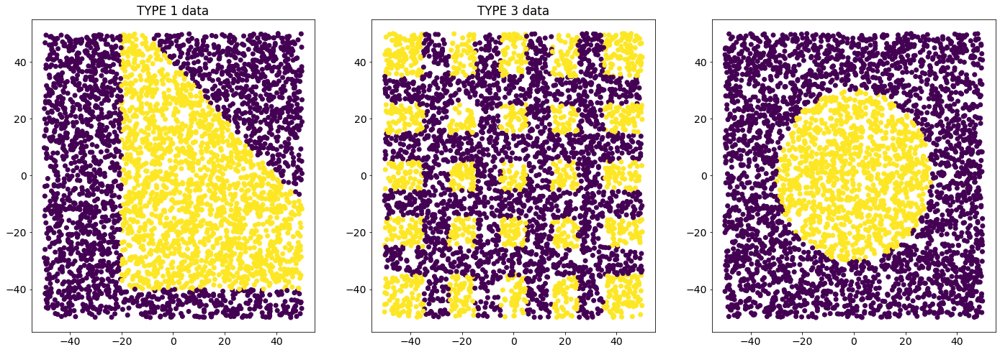

In [2]:
# Rescaling since known distribution
def rescale(x):
    return x/50

def f(x,c=1):
    r= np.zeros(x.shape[0])
    if c==0:
        # Stripe Pattern
        for i,x_i in enumerate(x):
            if (abs(x_i[0]) >35) or (abs(x_i[0])< 25 and abs(x_i[0]) > 15) or (abs(x_i[0])<5):
                if (abs(x_i[1]) >35) or (abs(x_i[1])< 25 and abs(x_i[1]) > 15) or (abs(x_i[1])<5):
                    r[i]=1
    if c==1:
        # Triangle
        for i,x_i in enumerate(x):
            r[i] = x_i[0]>-20 and x_i[1]>-40 and x_i[0]+x_i[1] < 40
    # if c==2:
    #     for i,x_i in enumerate(x):
    #         if (np.sign(x_i.sum())*np.sign(x_i[0]))*np.cos(np.linalg.norm(x_i)/(2*np.pi))>0:
    #             r[i]=1
    if c == 3:
        for i,x_i in enumerate(x):
            r[i] = x_i[0]*x_i[0] + x_i[1]*x_i[1] < 30*30

    
    return r



def create_datapoints(N=4000,L=L,B=100,TYPE = 1):
    """
    Creates datapoints and returns x,y

    Inputs
    ----------
    N : number of datapoints, default 4000
    L : size of each sample, default 2
    B : box size, default 100
    TYPE : argument for labeling function

    Outputs
    ---------
    x : np.array of shape (N,L) with data
    y : np.array of shape (N,) with labels 
    """
    x = (np.random.random((N,L))-0.5)*B
    y = f(x,c = TYPE)
    return x,y

def create_datasets(N_train=3200,N_valid = 800,L=L,B=100,TYPE = 1):
    """
    Creates datapoints and returns x,y

    Inputs
    ----------
    N_test : number of test datapoints, default 3200
    N_valid : number of validation datapoints, default 800
    L : size of each sample, default 2
    B : box size, default 100
    TYPE : argument for labeling function

    Outputs
    ---------
    x_train,y_train,x_val,y_val
    """
    x,y = create_datapoints(N= N_valid+N_train,L=L,B=B,TYPE=TYPE)

    x_train, y_train =rescale(x[:N_train]) ,y[:N_train]
    x_valid, y_valid =rescale(x[N_train:]), y[N_train:]
    return x_train,y_train,x_valid,y_valid


fig,axs = plt.subplots(1,3,figsize=(24,8))

# Create default dataset
x,y = create_datapoints()
# Display default dataset
axs[0].scatter(x[:,0],x[:,1],c=y)

x,y = create_datapoints(TYPE=0)
# Display default dataset
axs[1].scatter(x[:,0],x[:,1],c=y)

x,y = create_datapoints(TYPE=3)
# Display default dataset
axs[2].scatter(x[:,0],x[:,1],c=y)

axs[0].set_title("TYPE 1 data")
axs[1].set_title("TYPE 0 data")
axs[1].set_title("TYPE 3 data")

plt.show()

## Defining the models with Keras

In [3]:

def create_model(optimizer = "adam",dropout = 0.2,hidden_layers = 2
    ,activation_hidden_layers = 'relu',number_of_nodes = 20
    # ,initializer_hidden_layers = HeNormal()
    ):
    """
    returns a complied model with the given parameters  
    """
    model = Sequential()
    model.add(Dense(L,input_shape=(L,),activation = 'relu'))
    for i in range(hidden_layers):
        model.add(Dense(number_of_nodes,activation=activation_hidden_layers
        # ,kernel_initializer=initializer_hidden_layers
        )
        )
        model.add(Dropout(dropout))

    model.add(Dense(1,activation='sigmoid'))
    model.compile(loss= 'binary_crossentropy',
    optimizer = optimizer,
    metrics = ['accuracy'])
    return model



## Functions for analysis

In [4]:
def fit_stat(fit):
    return np.average(fit.history['val_accuracy'][-10:]),np.std((fit.history['val_accuracy'][-10:]))


def model_accuracy(model,N_train = 3200,N_valid = 800):
    x,y = create_datapoints(N= N_train+N_valid)

    x_train, y_train =rescale(np.copy(x[:N_train])) ,np.copy(y[:N_train])
    x_valid, y_valid =rescale(np.copy(x[N_train:])), np.copy(y[N_train:])

    # reducing size of training
    fit = model.fit(x_train,y_train,
        epochs= epochs, batch_size= batch_size,
        validation_data=(x_valid,y_valid),
        verbose=0)
    
    return fit_stat(fit)

## Visualization

In [22]:
def plot_fit_series(fits,parameters,label_extra,yscale='linear'):
    fig,axs = plt.subplots(1,2,figsize = (16,8))
    colors = [plt.get_cmap("tab10")(i) for i in range(np.array(parameters).size)]
    ax = axs[0]
    for fit,parameter,color in zip(fits,parameters,colors):
        label_extra_str = label_extra(parameter)
        ax.plot(fit.history["accuracy"],color = color,ls='--' ,label="Acc"+label_extra_str)
        ax.plot(fit.history["val_accuracy"],label=f"Val Acc"+label_extra_str,color = color)
    ax.grid()
    ax.set_ylim(top=1)
    ax.set_yscale(yscale)
    ax.legend()

    ax = axs[1]
    for fit,parameter,color in zip(fits,parameters,colors):
        label_extra_str = label_extra(parameter)
        ax.plot(fit.history["loss"],color = color,ls='--' ,label=f"Loss"+label_extra_str)
        ax.plot(fit.history["val_loss"],label=f"Val Loss"+label_extra_str,color = color)
    ax.grid()
    # ax.set_ylim(bottom=0)
    ax.set_yscale(yscale)
    ax.legend()
    plt.tight_layout()
    plt.show()

## Effect of number of samples


### Varrying number of traning samples

In [8]:
# Compiling optimal model
opt_hidden_layers = 2
opt_number_of_nodes = 40

epochs = 400
batch_size = 64

N_check = 10
N_trains = [100,200,400,800,1600,3200,6400,10280]
avg = np.zeros((N_check,len(N_trains)))
std = []
for n in range(N_check):
    for m,N_train in enumerate(N_trains):
        model = create_model(hidden_layers=opt_hidden_layers
            ,number_of_nodes=opt_number_of_nodes)
        curr_avg,curr_std = model_accuracy(model,N_train=N_train)
        avg[n,m] = curr_avg

KeyboardInterrupt: 

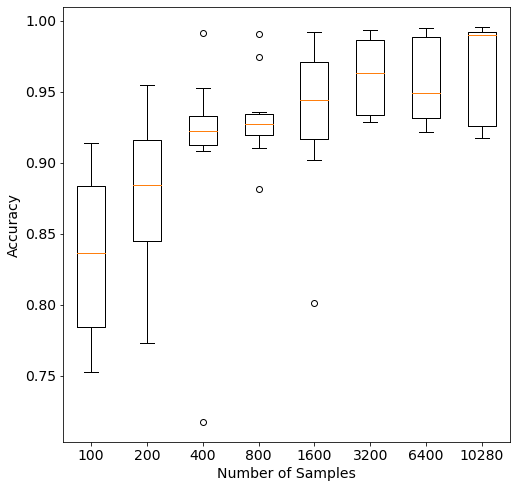

TypeError: 'History' object is not subscriptable

In [ ]:
fig,ax = plt.subplots(1,1,figsize = (8,8))
# np.save(os.path.join("saved_models","num_samples_acc_source_nepoch400_node40_hl2"),avg)
ax.boxplot(avg)
ax.set_xticklabels(N_trains)
ax.set_xlabel("Number of Samples")
ax.set_ylabel("Accuracy")
# plt.savefig(os.path.join("figures","num_samples_acc.pdf"))
plt.show()
plt.show()

### Augmenting the data

Try adding a small difference to each point for twice as many points

In [6]:
def agument_data(org_x_train,org_y_train,multiplier = 2, epsilon = 1e-4):
    org_N = org_x_train.shape[0]
    org_L = org_x_train.shape[1]
    x_train_agumented = np.zeros((org_N*multiplier,org_L))
    y_train_agumented = np.zeros((org_N*multiplier))
    

    x_train_agumented[:org_N] = np.copy(org_x_train)
    y_train_agumented[:org_N] = np.copy(org_y_train)
    
    # Filling the rest of the array
    for i in range(multiplier-1):
        x_train_agumented[(i+1)*org_N:(i+2)*org_N] = np.copy(org_x_train)+ np.random.uniform(-epsilon,epsilon,size=(org_N,org_L))
        y_train_agumented[(i+1)*org_N:(i+2)*org_N] = np.copy(org_y_train)
    
    # Shuffeling the data
    permutation = np.random.permutation(x_train_agumented.shape[0])

    x_train_agumented = x_train_agumented[permutation]
    y_train_agumented = y_train_agumented[permutation]

    return x_train_agumented,y_train_agumented


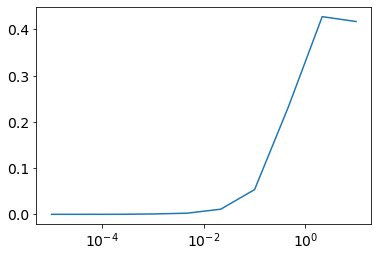

In [290]:
x_t,y_t,x_v,y_v = create_datasets()

wrong_points = []
epsilons = np.logspace(-5,1,num=10)
for epsilon in epsilons:
    x_train_agumented,y_train_agumented = agument_data(x_t,y_t,multiplier=16,epsilon=epsilon)


    # print(x_train_agumented[0:10]*50)
    y_train_agumented_actual = f(x_train_agumented*50)
    wrong_points.append( np.average((abs(y_train_agumented-y_train_agumented_actual))))

plt.plot(epsilons,wrong_points)
plt.xscale('log')
plt.show()

In [67]:

N = 4000
N_train = 3200
x,y = create_datapoints(N= N)

# Changed so it would not be to good
opt_hidden_layers = 2
opt_number_of_nodes = 40 #40
model = create_model(hidden_layers=opt_hidden_layers
    ,number_of_nodes=opt_number_of_nodes)

epochs = 200
batch_size = 128
N_check = 10
x_train, y_train =rescale(np.copy(x[:N_train])) ,np.copy(y[:N_train])
x_valid, y_valid =rescale(np.copy(x[N_train:])), np.copy(y[N_train:])


multipliers = np.array([1,2,4,8,16])
epsilons = np.array([0,1e-5,1e-4,1e-3,1e-2,1e-1,1])

avg_array = np.zeros((N_check,multipliers.size,epsilons.size))    
model = create_model(hidden_layers=opt_hidden_layers
                    ,number_of_nodes=opt_number_of_nodes)

for n in range(N_check):
    for i,multiplier in enumerate(multipliers):
        if i == 0:
            # The epsilons has noe effect when it is one
            aug_fit = model.fit(x_train,y_train,
                epochs= epochs, batch_size= batch_size,
                validation_data=(x_valid,y_valid),
                verbose=0)
            aug_avg,aug_std = fit_stat(aug_fit)        

            avg_array[n,0,:] = aug_avg*np.ones(epsilons.size)
        else:
            for j,epsilon in enumerate(epsilons):
                x_train_agumented,y_train_agumented = agument_data(x_train,y_train,multiplier=multiplier,epsilon=epsilon)
                aug_fit = model.fit(x_train_agumented,y_train_agumented,
                    epochs= epochs, batch_size= batch_size,
                    validation_data=(x_valid,y_valid),
                    verbose=0)
                aug_avg,aug_std = fit_stat(aug_fit)        
                
                avg_array[n,i,j] = aug_avg

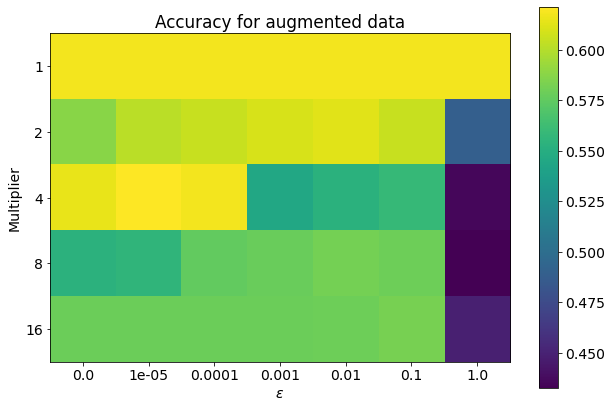

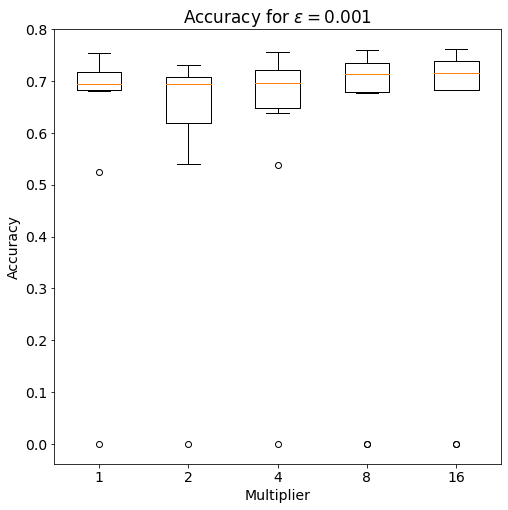

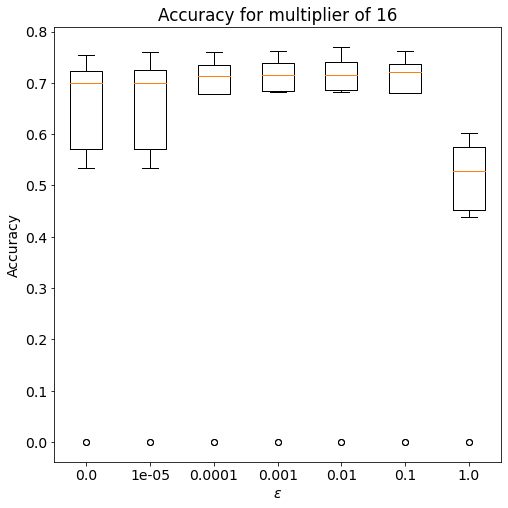

In [281]:
# np.save(os.path.join("saved_models","aug_array"),avg_array)

avg_flatten_array = np.average(avg_array,axis=0)

fig, ax = plt.subplots(figsize=(9,6))
im = ax.imshow(avg_flatten_array)
plt.colorbar(im)

# Show all ticks and label them with the respective list entries

ax.set_title("Accuracy for augmented data")
ax.set_xlabel(r"$\epsilon$")
ax.set_xticks(np.arange(len(epsilons)))#), labels=epsilons)
ax.set_xticklabels(epsilons)
ax.set_ylabel("Multiplier")
ax.set_yticks(np.arange(len(multipliers)))#, labels=multipliers)
ax.set_yticklabels(multipliers)
plt.tight_layout()
plt.savefig(os.path.join("figures","aug_samples_acc.pdf"))
plt.show()


fig,ax = plt.subplots(1,1,figsize = (8,8))
ax.set_title(r"Accuracy for $\epsilon = 0.001$")
ax.boxplot(avg_array[:,:,2])
ax.set_xticklabels(multipliers)
ax.set_xlabel("Multiplier")
ax.set_ylabel("Accuracy")
plt.show()

fig,ax = plt.subplots(1,1,figsize = (8,8))
ax.set_title(r"Accuracy for multiplier of 16")
ax.boxplot(avg_array[:,-2,:])
ax.set_xticklabels(epsilons)
ax.set_xlabel(r"$\epsilon$")
ax.set_ylabel("Accuracy")
plt.show()

## Optimizing for standard case


In [75]:
N_valid = 800
N_train = 1600
batch_size = 128
epochs = 50#40


x,y = create_datapoints(N= N_valid+N_train)

x_train, y_train =rescale(np.copy(x[:N_train])) ,np.copy(y[:N_train])
x_valid, y_valid =rescale(np.copy(x[N_train:])), np.copy(y[N_train:])


# Model for doing grid search
model_gridsearch = KerasClassifier(build_fn=create_model, 
                        epochs=epochs, 
                        batch_size=batch_size, 
                        verbose=0)

number_of_nodes = [20,40,80,120]
hidden_layers = [2,3,4,5]
# Sigmoid is realy crap
# activation_hidden_layers = ["relu", "sigmoid"]

param_grid = dict(number_of_nodes = number_of_nodes, hidden_layers = hidden_layers
    # , activation_hidden_layers = activation_hidden_layers
    )

# call scikit grid search module
grid = GridSearchCV(estimator=model_gridsearch, param_grid=param_grid, n_jobs=1, cv=4)

grid_result = grid.fit(x_train,y_train)

# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))



C:\Users\chris\AppData\Local\Temp\ipykernel_7048\513560497.py:14: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model_gridsearch = KerasClassifier(build_fn=create_model,


Best: 0.923750 using {'hidden_layers': 3, 'number_of_nodes': 80}
0.779375 (0.092827) with: {'hidden_layers': 2, 'number_of_nodes': 20}
0.858750 (0.050078) with: {'hidden_layers': 2, 'number_of_nodes': 40}
0.850625 (0.068383) with: {'hidden_layers': 2, 'number_of_nodes': 80}
0.862500 (0.056706) with: {'hidden_layers': 2, 'number_of_nodes': 120}
0.823125 (0.095187) with: {'hidden_layers': 3, 'number_of_nodes': 20}
0.852500 (0.051387) with: {'hidden_layers': 3, 'number_of_nodes': 40}
0.923750 (0.019804) with: {'hidden_layers': 3, 'number_of_nodes': 80}
0.923750 (0.025769) with: {'hidden_layers': 3, 'number_of_nodes': 120}
0.826875 (0.084915) with: {'hidden_layers': 4, 'number_of_nodes': 20}
0.864375 (0.045668) with: {'hidden_layers': 4, 'number_of_nodes': 40}
0.904375 (0.028415) with: {'hidden_layers': 4, 'number_of_nodes': 80}
0.901875 (0.030689) with: {'hidden_layers': 4, 'number_of_nodes': 120}
0.783750 (0.090234) with: {'hidden_layers': 5, 'number_of_nodes': 20}
0.862500 (0.041003) wi

In [83]:
N_check = 10
N_valid = 800
N_train = 1600
batch_size = 128
epochs = 50


x,y = create_datapoints(N= N_valid+N_train)

x_train, y_train =rescale(np.copy(x[:N_train])) ,np.copy(y[:N_train])
x_valid, y_valid =rescale(np.copy(x[N_train:])), np.copy(y[N_train:])


number_of_nodes = np.array([10,20,40,80,120])
hidden_layers = np.array([1,2,3,4,5])

avg_array = np.zeros((N_check,number_of_nodes.size,hidden_layers.size))  


for n in range(N_check):
    for i,number_of_node in enumerate(number_of_nodes):
        for j,hidden_layer in enumerate(hidden_layers):
            model = create_model(hidden_layers=hidden_layer ,number_of_nodes=number_of_node)
            fit = model.fit(x_train,y_train,
            epochs= epochs, batch_size= batch_size,
            validation_data=(x_valid,y_valid),
            verbose=0)

            avg,std = fit_stat(fit)        
            
            avg_array[n,i,j] = avg






# fig, ax = plt.subplots(figsize=(9,6))
# im = ax.imshow(avg_array)
# plt.colorbar(im)

# # Show all ticks and label them with the respective list entries

# # ax.set_title("Accuracy in circle")
# ax.set_xlabel("Hidden layers")
# ax.set_xticks(np.arange(len(hidden_layers)))#), labels=epsilons)
# ax.set_xticklabels(hidden_layers)
# ax.set_ylabel("Number of nodes")
# ax.set_yticks(np.arange(len(number_of_nodes)))#, labels=multipliers)
# ax.set_yticklabels(number_of_nodes)
# # plt.tight_layout()
# plt.show()

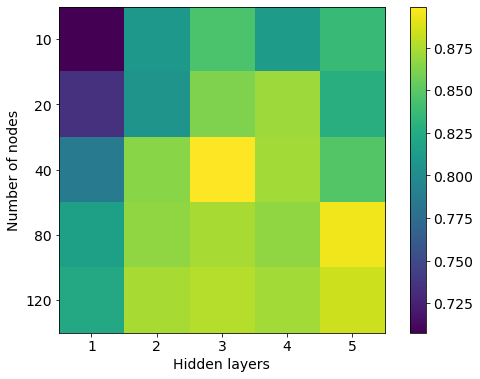

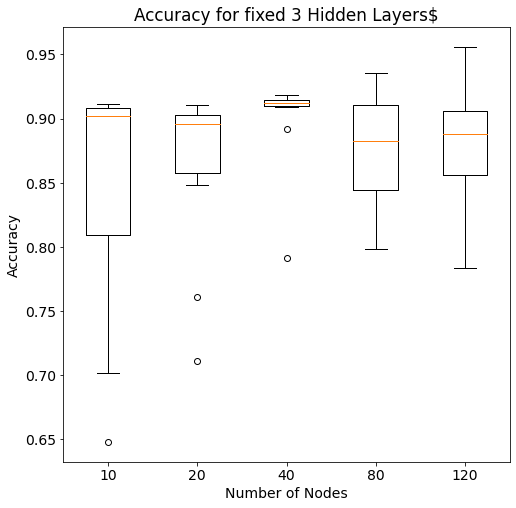

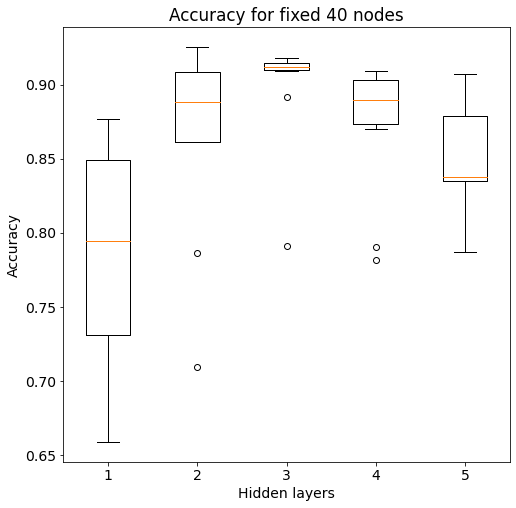

In [90]:
np.save(os.path.join("saved_models","arcticecture_ar"),avg_array)

avg_flatten_array = np.average(avg_array,axis=0)

fig, ax = plt.subplots(figsize=(9,6))
im = ax.imshow(avg_flatten_array)
plt.colorbar(im)

# Show all ticks and label them with the respective list entries

# ax.set_title("Accuracy in circle")
ax.set_xlabel("Hidden layers")
ax.set_xticks(np.arange(len(hidden_layers)))#), labels=epsilons)
ax.set_xticklabels(hidden_layers)
ax.set_ylabel("Number of nodes")
ax.set_yticks(np.arange(len(number_of_nodes)))#, labels=multipliers)
ax.set_yticklabels(number_of_nodes)
# plt.tight_layout()
plt.show()


fig,ax = plt.subplots(1,1,figsize = (8,8))
ax.set_title(r"Accuracy for fixed 3 Hidden Layers")
ax.boxplot(avg_array[:,:,2])
ax.set_xticklabels(number_of_nodes)
ax.set_xlabel("Number of Nodes")
ax.set_ylabel("Accuracy")
plt.show()

fig,ax = plt.subplots(1,1,figsize = (8,8))
ax.set_title(r"Accuracy for fixed 40 nodes")
ax.boxplot(avg_array[:,2,:])
ax.set_xticklabels(hidden_layers)
ax.set_xlabel(r"Hidden layers")
ax.set_ylabel("Accuracy")
plt.show()

In [87]:
N_check = 10
N_valid = 800
N_train = 1600
batch_size = 128
epochs = 50


x,y = create_datapoints(N= N_valid+N_train,TYPE=3)

x_train, y_train =rescale(np.copy(x[:N_train])) ,np.copy(y[:N_train])
x_valid, y_valid =rescale(np.copy(x[N_train:])), np.copy(y[N_train:])


number_of_nodes = np.array([10,20,40,80,120])
hidden_layers = np.array([1,2,3,4,5])

avg_array_0 = np.zeros((N_check,number_of_nodes.size,hidden_layers.size))  


for n in range(N_check):
    for i,number_of_node in enumerate(number_of_nodes):
        for j,hidden_layer in enumerate(hidden_layers):
            model = create_model(hidden_layers=hidden_layer ,number_of_nodes=number_of_node)
            fit = model.fit(x_train,y_train,
            epochs= epochs, batch_size= batch_size,
            validation_data=(x_valid,y_valid),
            verbose=0)

            avg,std = fit_stat(fit)        
            
            avg_array_0[n,i,j] = avg




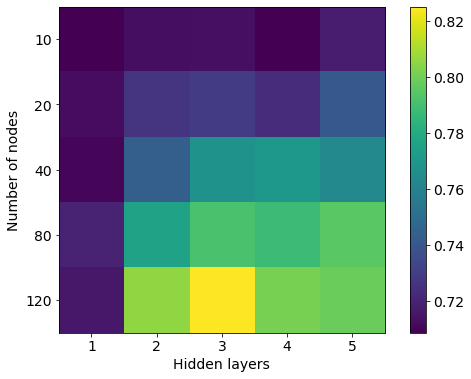

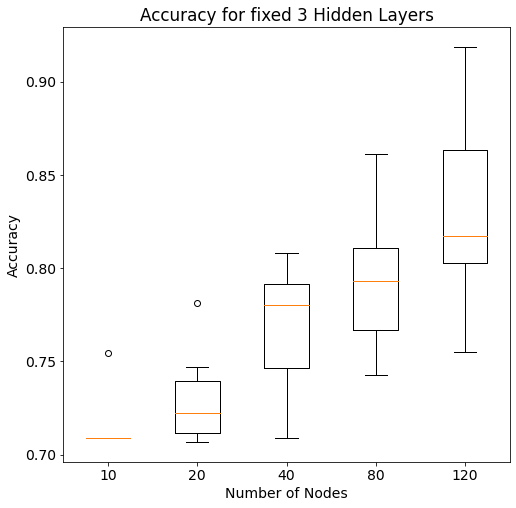

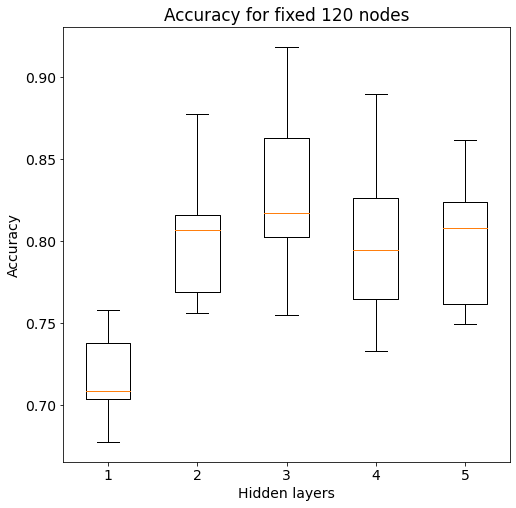

In [92]:
np.save(os.path.join("saved_models","arcticecture_ar_tp_3"),avg_array_0)

avg_flatten_array = np.average(avg_array_0,axis=0)

fig, ax = plt.subplots(figsize=(9,6))
im = ax.imshow(avg_flatten_array)
plt.colorbar(im)

# Show all ticks and label them with the respective list entries

# ax.set_title("Accuracy in circle")
ax.set_xlabel("Hidden layers")
ax.set_xticks(np.arange(len(hidden_layers)))#), labels=epsilons)
ax.set_xticklabels(hidden_layers)
ax.set_ylabel("Number of nodes")
ax.set_yticks(np.arange(len(number_of_nodes)))#, labels=multipliers)
ax.set_yticklabels(number_of_nodes)
plt.show()


fig,ax = plt.subplots(1,1,figsize = (8,8))
ax.set_title(r"Accuracy for fixed 3 Hidden Layers")
ax.boxplot(avg_array_0[:,:,2])
ax.set_xticklabels(number_of_nodes)
ax.set_xlabel("Number of Nodes")
ax.set_ylabel("Accuracy")
plt.show()

fig,ax = plt.subplots(1,1,figsize = (8,8))
ax.set_title(r"Accuracy for fixed 120 nodes")
ax.boxplot(avg_array_0[:,-1,:])
ax.set_xticklabels(hidden_layers)
ax.set_xlabel(r"Hidden layers")
ax.set_ylabel("Accuracy")
plt.show()

### Looking at different optimizers

In [ ]:
# Compiling optimal model

N = 4000
N_train = int(0.8*N)

x,y = create_datapoints(N= N,TYPE = 1)

x_train, y_train =rescale(np.copy(x[:N_train])) ,np.copy(y[:N_train])
x_valid, y_valid =rescale(np.copy(x[N_train:])), np.copy(y[N_train:])


opt_hidden_layers = 2
opt_number_of_nodes = 40
model_SGD = create_model(hidden_layers=opt_hidden_layers
    ,number_of_nodes=opt_number_of_nodes,optimizer="SGD")

epochs = 1
batch_size = 32

fit_SGD = model_SGD.fit(x_train,y_train,
    epochs= epochs, batch_size= batch_size,
    validation_data=(x_valid,y_valid),
    verbose=0)



opt_hidden_layers = 2
opt_number_of_nodes = 40
model = create_model(hidden_layers=opt_hidden_layers
    ,number_of_nodes=opt_number_of_nodes,)

fit = model.fit(x_train,y_train,
    epochs= epochs, batch_size= batch_size,
    validation_data=(x_valid,y_valid),
    verbose=0)

Finaly 10 point validation accuracy ADAM : 0.889125007390976(0.002683855568761317)
Finaly 10 point validation accuracy SGD : 0.5600000023841858(0.0)


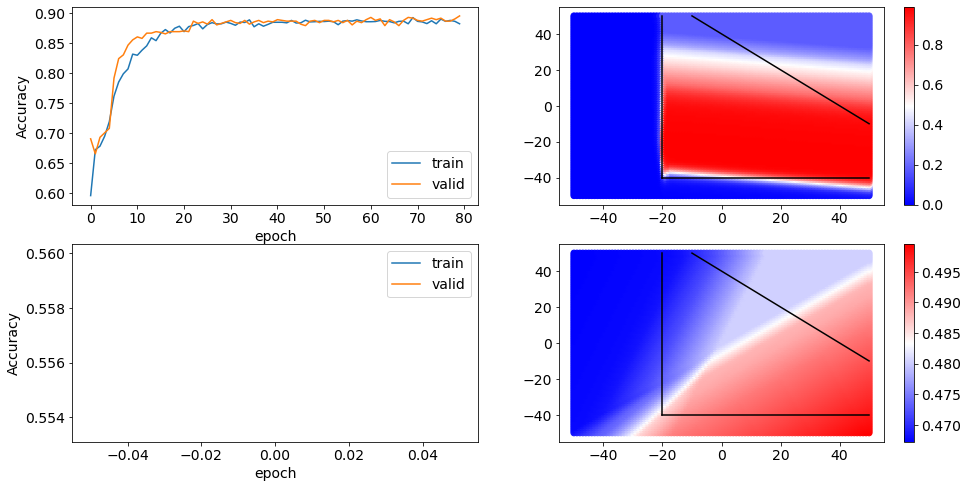

In [38]:
opt_accuracy,std_accuracy = fit_stat(fit)
print(f"Finaly 10 point validation accuracy ADAM : {opt_accuracy}({std_accuracy})")
opt_accuracy,std_accuracy = fit_stat(fit_SGD)
print(f"Finaly 10 point validation accuracy SGD : {opt_accuracy}({std_accuracy})")


def plot_accuracy(fit,ax = None,train_label = "train",valid_label="valid",xlabel = None,ylabel = None,legend=True):
    if ax == None:
        ax = plt.gca()
    ax.plot(fit.history['accuracy'],label="train")
    ax.plot(fit.history['val_accuracy'],label="valid")
    if xlabel != None:
        ax.set_xlabel(xlabel)
    if ylabel != None:
        ax.set_ylabel(ylabel)
    if legend:
        ax.legend()

def plot_accuracy_dict(dict,ax = None,train_label = "train",valid_label="valid",xlabel = None,ylabel = None,legend=True):
    if ax == None:
        ax = plt.gca()
    ax.plot(fit.history['accuracy'],label="train")
    ax.plot(fit.history['val_accuracy'],label="valid")
    if xlabel != None:
        ax.set_xlabel(xlabel)
    if ylabel != None:
        ax.set_ylabel(ylabel)
    if legend:
        ax.legend()
def boundaries(ax = None):
    if ax == None:
        ax = plt.gca()    
    ax.plot((-20,-20),(-40,50),c="black")
    ax.plot((-20,50),(-40,-40),c="black")
    ax.plot((-10,50),(50,-10),c="black")


# ax.plot(fit.history['accuracy'],label="train")
# ax.plot(fit.history['val_accuracy'],label="valid")
# ax.set_xlabel('epoch')
# ax.set_ylabel("Accuracy")

def make_grid(dX=1,size=50):
    dX = 1
    X1 = np.arange(-50,50+dX, dX)
    LG = len(X1)
    grid = np.zeros((LG*LG,2))
    k=0
    for i in range(LG):
        for j in range(LG):
            grid[k,:]=(X1[j],X1[i])
            k=k+1
    return grid

def scatter_grid(model,ax = None):
    if ax == None:
        ax = plt.gca()
    
    grid = make_grid()
    # RESCALE
    grid_r = rescale(grid)

    pred = model.predict(grid_r)
    scatter = ax.scatter(grid[:,0],grid[:,1],c=pred,cmap='bwr')
    return scatter



fig,axs = plt.subplots(2,2,figsize = (16,8))

ax = axs[0,0]
plot_accuracy(fit,ax = ax,xlabel='epoch',ylabel='Accuracy')

ax=axs[0,1]
boundaries(ax)
scatter = scatter_grid(model,ax)
plt.colorbar(scatter,ax = ax)

ax = axs[1,0]
plot_accuracy(fit_SGD,ax = ax,xlabel='epoch',ylabel='Accuracy')

ax=axs[1,1]
boundaries(ax)
scatter = scatter_grid(model_SGD,ax)

plt.colorbar(scatter,ax = ax)
plt.show()

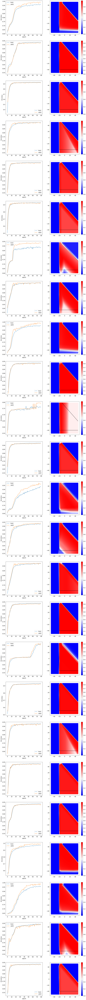

In [42]:
N = 4000
N_train = int(0.8*N)

x,y = create_datapoints(N= N,TYPE = 1)

x_train, y_train =rescale(np.copy(x[:N_train])) ,np.copy(y[:N_train])
x_valid, y_valid =rescale(np.copy(x[N_train:])), np.copy(y[N_train:])

opt_hidden_layers = 2
opt_number_of_nodes = 40
epochs = 80
batch_size = 64

opt_hidden_layers = 2
opt_number_of_nodes = 20


num_starts = 25

fig,axs = plt.subplots(num_starts,2,figsize = (16,8*num_starts))

for n in range(num_starts):
    model = create_model(hidden_layers=opt_hidden_layers
    ,number_of_nodes=opt_number_of_nodes,)

    fit = model.fit(x_train,y_train,
        epochs= epochs, batch_size= batch_size,
        validation_data=(x_valid,y_valid),
        verbose=0)
    ax = axs[n,0]
    plot_accuracy(fit,ax = ax,xlabel='epoch',ylabel='Accuracy')

    ax=axs[n,1]
    boundaries(ax)
    scatter = scatter_grid(model,ax)
    plt.colorbar(scatter,ax = ax)

plt.show()

## Circle

In [43]:
N = 4000
N_train = int(0.8*N)
batch_size = 64
epochs = 1

x,y = create_datapoints(N= N,TYPE = 3)



x_train, y_train =rescale(np.copy(x[:N_train])) ,np.copy(y[:N_train])
x_valid, y_valid =rescale(np.copy(x[N_train:])), np.copy(y[N_train:])
# Compiling optimal model
opt_hidden_layers = 2
opt_number_of_nodes = 40
model = create_model(hidden_layers=opt_hidden_layers
    ,number_of_nodes=opt_number_of_nodes,activation_hidden_layers='relu')

epochs = 400
batch_size = 256
fit = model.fit(x_train,y_train,
    epochs= epochs, batch_size= batch_size,
    validation_data=(x_valid,y_valid),
    verbose=0)

Finaly 10 point validation accuracy : 0.779999989271164(0.0013693159702595247)


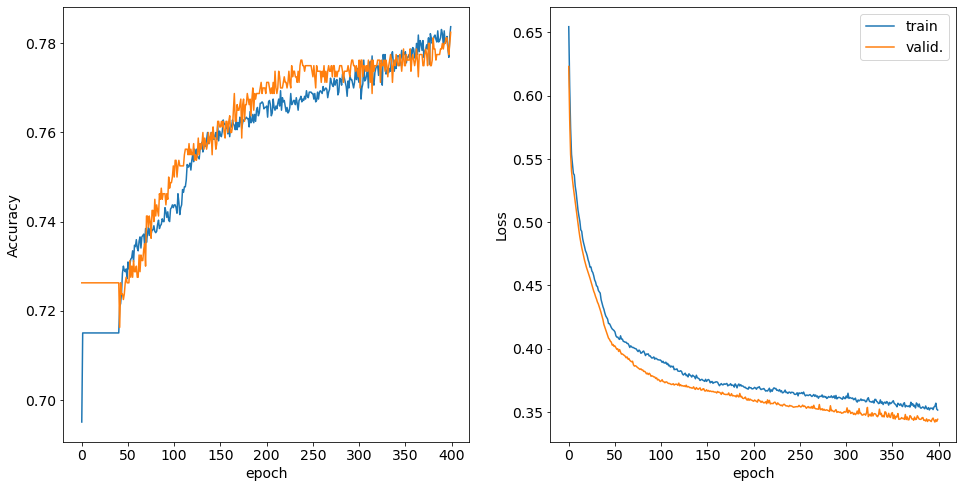

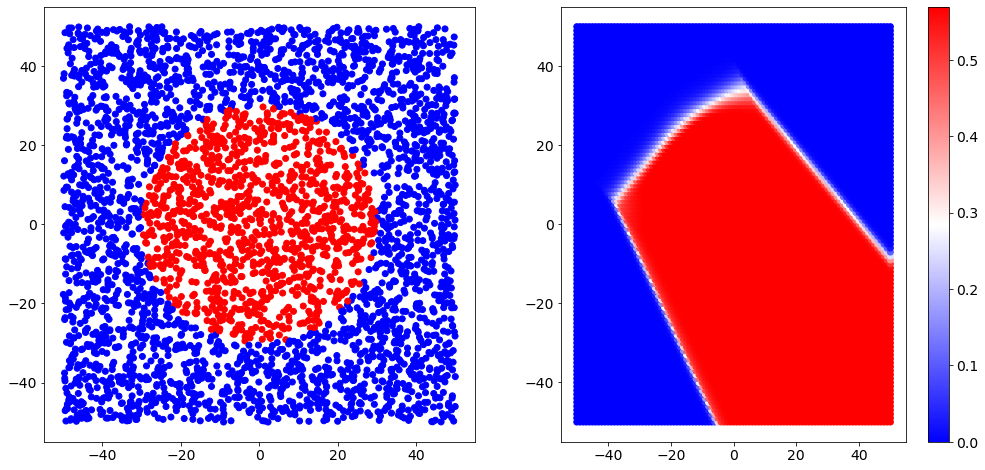

In [44]:
fig,axs = plt.subplots(1,2,figsize = (16,8))

opt_accuracy,std_accuracy = fit_stat(fit)
print(f"Finaly 10 point validation accuracy : {opt_accuracy}({std_accuracy})")

ax = axs[0]
ax.plot(fit.history['accuracy'],label="train")
ax.plot(fit.history['val_accuracy'],label="valid")
ax.set_xlabel('epoch')
ax.set_ylabel("Accuracy")

ax = axs[1]
ax.plot(fit.history['loss'],label="train")
ax.plot(fit.history['val_loss'],label="valid.")
ax.set_xlabel('epoch')
ax.set_ylabel("Loss")
ax.legend()
plt.show()



dX = 1
X1 = np.arange(-50,50+dX, dX)
LG = len(X1)
grid = np.zeros((LG*LG,2))
k=0
for i in range(LG):
    for j in range(LG):
        grid[k,:]=(X1[j],X1[i])
        k=k+1

# RESCALE
grid_r = rescale(grid)

pred = model.predict(grid_r)

fig,AX=plt.subplots(1,2,figsize=(17,8))

ax=AX[0]
ax.scatter(x[:,0],x[:,1],c=y,cmap='bwr')
ax=AX[1]
scatter = ax.scatter(grid[:,0],grid[:,1],c=pred,cmap='bwr')
plt.colorbar(scatter)
plt.show()

### Optimizing Parameters

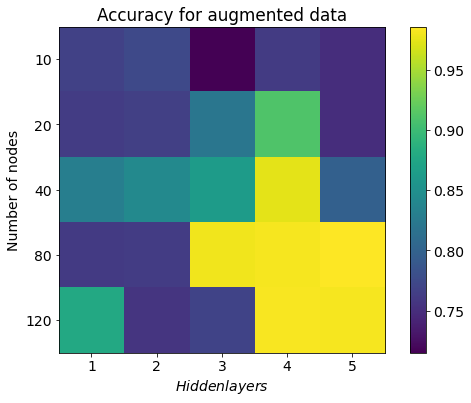

In [45]:
N = 4000
N_train = int(0.8*N)
batch_size = 64
epochs = 1

epochs = 100
batch_size = 32


x,y = create_datapoints(N= N,TYPE = 3)

x_train, y_train =rescale(np.copy(x[:N_train])) ,np.copy(y[:N_train])
x_valid, y_valid =rescale(np.copy(x[N_train:])), np.copy(y[N_train:])

number_of_nodes = np.array([10,20,40,80,120])
hidden_layers = np.array([1,2,3,4,5])

avg_array = np.zeros((number_of_nodes.size,hidden_layers.size))
std_array = np.zeros((number_of_nodes.size,hidden_layers.size))


for i,number_of_node in enumerate(number_of_nodes):
    for j,hidden_layer in enumerate(hidden_layers):
        
        model = create_model(hidden_layers=hidden_layer ,number_of_nodes=number_of_node)
        fit = model.fit(x_train,y_train,
        epochs= epochs, batch_size= batch_size,
        validation_data=(x_valid,y_valid),
        verbose=0)

        avg,std = fit_stat(fit)        
        
        avg_array[i,j] = avg
        std_array[i,j] = std






fig, ax = plt.subplots(figsize=(9,6))
im = ax.imshow(avg_array)
plt.colorbar(im)

# Show all ticks and label them with the respective list entries

# ax.set_title("Accuracy in circle")
ax.set_xlabel("Hidden layers")
ax.set_xticks(np.arange(len(hidden_layers)))#), labels=epsilons)
ax.set_xticklabels(hidden_layers)
ax.set_ylabel("Number of nodes")
ax.set_yticks(np.arange(len(number_of_nodes)))#, labels=multipliers)
ax.set_yticklabels(number_of_nodes)
# plt.tight_layout()
plt.show()

## Not allways that easy

In [8]:
N = 4000
N_train = int(0.8*N)
batch_size = 64
epochs = 1

x,y = create_datapoints(N= N,TYPE = 0)



x_train, y_train =rescale(np.copy(x[:N_train])) ,np.copy(y[:N_train])
x_valid, y_valid =rescale(np.copy(x[N_train:])), np.copy(y[N_train:])


# Model for doing grid search
model_gridsearch = KerasClassifier(build_fn=create_model, 
                        epochs=epochs, 
                        batch_size=batch_size, 
                        verbose=0)

number_of_nodes = [20,40,80,120]
hidden_layers = [2,3,4,5]
# Sigmoid is realy crap
# activation_hidden_layers = ["relu", "sigmoid"]

param_grid = dict(number_of_nodes = number_of_nodes, hidden_layers = hidden_layers
    # , activation_hidden_layers = activation_hidden_layers
    )

# call scikit grid search module
grid = GridSearchCV(estimator=model_gridsearch, param_grid=param_grid, n_jobs=1, cv=4)

grid_result = grid.fit(x_train,y_train)

# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))


<ipython-input-8-72cbf44d5d30>:15: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model_gridsearch = KerasClassifier(build_fn=create_model,


Best: 0.647500 using {'hidden_layers': 3, 'number_of_nodes': 20}
0.644688 (0.008449) with: {'hidden_layers': 2, 'number_of_nodes': 20}
0.644688 (0.008449) with: {'hidden_layers': 2, 'number_of_nodes': 40}
0.644688 (0.008449) with: {'hidden_layers': 2, 'number_of_nodes': 80}
0.644688 (0.008449) with: {'hidden_layers': 2, 'number_of_nodes': 120}
0.647500 (0.013199) with: {'hidden_layers': 3, 'number_of_nodes': 20}
0.644688 (0.008449) with: {'hidden_layers': 3, 'number_of_nodes': 40}
0.644688 (0.008449) with: {'hidden_layers': 3, 'number_of_nodes': 80}
0.644688 (0.008449) with: {'hidden_layers': 3, 'number_of_nodes': 120}
0.644688 (0.008449) with: {'hidden_layers': 4, 'number_of_nodes': 20}
0.644688 (0.008449) with: {'hidden_layers': 4, 'number_of_nodes': 40}
0.644688 (0.008449) with: {'hidden_layers': 4, 'number_of_nodes': 80}
0.644688 (0.008449) with: {'hidden_layers': 4, 'number_of_nodes': 120}
0.644688 (0.008449) with: {'hidden_layers': 5, 'number_of_nodes': 20}
0.644688 (0.008449) wi

In [18]:
# Compiling optimal model
opt_hidden_layers = 2
opt_number_of_nodes =20
model = create_model(hidden_layers=opt_hidden_layers
    ,number_of_nodes=opt_number_of_nodes)

epochs = 200
batch_size = 256
fit = model.fit(x_train,y_train,
    epochs= epochs, batch_size= batch_size,
    validation_data=(x_valid,y_valid),
    verbose=0)

Finaly 10 point validation accuracy : 0.673374992609024(0.0005728077584440644)


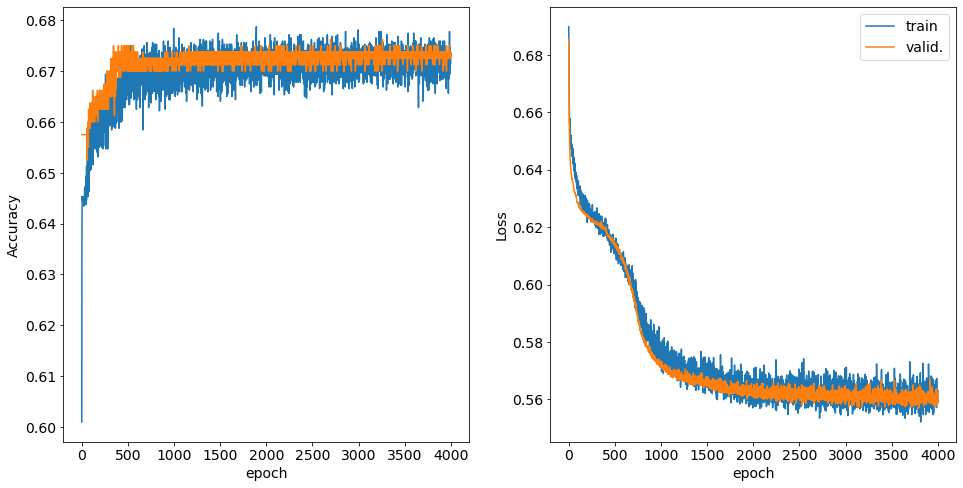

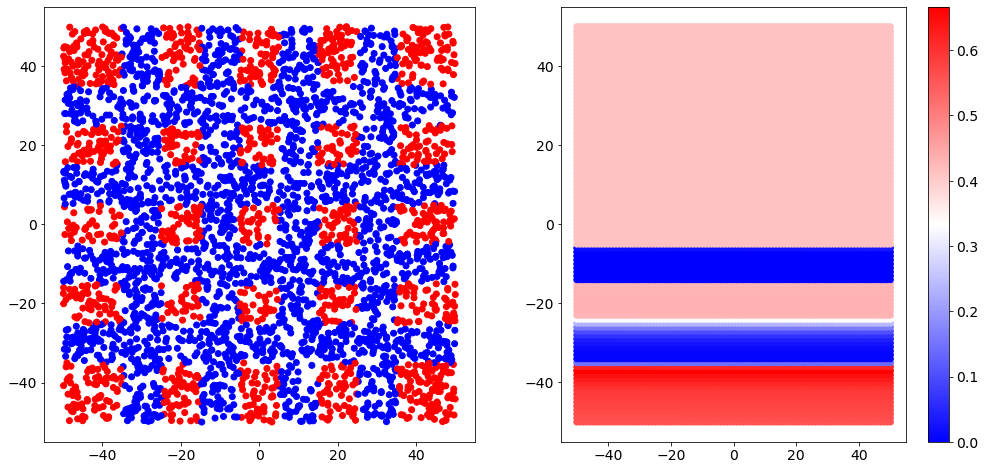

In [19]:
fig,axs = plt.subplots(1,2,figsize = (16,8))

opt_accuracy,std_accuracy = fit_stat(fit)
print(f"Finaly 10 point validation accuracy : {opt_accuracy}({std_accuracy})")

ax = axs[0]
ax.plot(fit.history['accuracy'],label="train")
ax.plot(fit.history['val_accuracy'],label="valid")
ax.set_xlabel('epoch')
ax.set_ylabel("Accuracy")

ax = axs[1]
ax.plot(fit.history['loss'],label="train")
ax.plot(fit.history['val_loss'],label="valid.")
ax.set_xlabel('epoch')
ax.set_ylabel("Loss")
ax.legend()
plt.show()



dX = 1
X1 = np.arange(-50,50+dX, dX)
LG = len(X1)
grid = np.zeros((LG*LG,2))
k=0
for i in range(LG):
    for j in range(LG):
        grid[k,:]=(X1[j],X1[i])
        k=k+1

# RESCALE
grid_r = rescale(grid)

pred = model.predict(grid_r)

fig,AX=plt.subplots(1,2,figsize=(17,8))

ax=AX[0]
ax.scatter(x[:,0],x[:,1],c=y,cmap='bwr')
ax=AX[1]
scatter = ax.scatter(grid[:,0],grid[:,1],c=pred,cmap='bwr')
plt.colorbar(scatter)
plt.show()

## Possible saving

In [ ]:
N = 4000
N_train = int(0.8*N)

SAVEPATH = "saved_models"
test_filename = "opt_adam_do_02_hl_2_act_relu_nn_40_ep_80_bs_64"
import os

opt_hidden_layers = 2
opt_number_of_nodes = 40
epochs = 80
batch_size = 64

x,y = create_datapoints(N= N,TYPE = 1)

x_train, y_train =rescale(np.copy(x[:N_train])) ,np.copy(y[:N_train])
x_valid, y_valid =rescale(np.copy(x[N_train:])), np.copy(y[N_train:])

model = create_model(hidden_layers=opt_hidden_layers
    ,number_of_nodes=opt_number_of_nodes,)

fit = model.fit(x_train,y_train,
    epochs= epochs, batch_size= batch_size,
    validation_data=(x_valid,y_valid),
    verbose=0)
filepath = os.path.join(SAVEPATH,test_filename)
model.save(filepath)
val_acc_filepath = os.path.join(filepath,"val_acc")
np.save(val_acc_filepath,fit.history["val_accuracy"])
acc_filepath = os.path.join(filepath,"acc")
np.save(acc_filepath,fit.history["accuracy"])


In [ ]:
def plot_model_from_file(filename,ax = None,**kwargs):
    if ax == None:
        fig,ax = plt.subplots(1,2,figsize=(16,8))
    filepath = os.path.join(SAVEPATH,filename)
    val_acc_filepath = os.path.join(filepath,"val_acc.npy")
    acc_filepath = os.path.join(filepath,"acc.npy")
    model = load_model(filepath)
    val_acc = np.load(val_acc_filepath)
    acc = np.load(acc_filepath)
    fit = {"accuracy" : acc, "val_accuracy": val_acc}
    plot_accuracy_dict(fit,ax = ax[0],**kwargs)
    
    scatter = scatter_grid(model,ax[1])
    plt.colorbar(scatter,ax = ax[1])

plot_model_from_file(test_filename)
plt.show()  

In [21]:
def plot_fit_series(fits,parameters,label_extra,yscale='linear'):
    fig,axs = plt.subplots(1,2,figsize = (16,8))
    colors = [plt.get_cmap("tab10")(i) for i in range(np.array(parameters).size)]
    ax = axs[0]
    for fit,parameter,color in zip(fits,parameters,colors):
        label_extra_str = label_extra(parameter)
        ax.plot(fit.history["accuracy"],color = color,ls='--' ,label="Acc"+label_extra_str)
        ax.plot(fit.history["val_accuracy"],label=f"Val Acc"+label_extra_str,color = color)
    ax.grid()
    ax.set_ylim(top=1)
    ax.set_yscale(yscale)
    ax.legend()

    ax = axs[1]
    for fit,parameter,color in zip(fits,parameters,colors):
        label_extra_str = label_extra(parameter)
        ax.plot(fit.history["loss"],color = color,ls='--' ,label=f"Loss"+label_extra_str)
        ax.plot(fit.history["val_loss"],label=f"Val Loss"+label_extra_str,color = color)
    ax.grid()
    # ax.set_ylim(bottom=0)
    ax.set_yscale(yscale)
    ax.legend()
    plt.tight_layout()
    plt.show()

## Playing around
Use default of 2 hidden layers and 20 nodes, early stopping with patience of 50, default of 3200 ntraning samples and 800 test samples, batch size of 64, optimizer relu, layer initializer HeNormal

In [48]:
epochs_def = 400
batch_size_def = 16 #was 64
hidden_layer_def = 4
dropout_def = 0.1 # was 0
number_of_nodes_def = 10
N_train_def = 3200
N_valid_def = 800
patience_def = 50
optimizer_def = "Adam"

In [52]:
weights_def_list = []
def weights_file(i):
    return os.path.join("saved_models",f"weights_def_{i}.h5")

for i in range(10):
    model = create_model(hidden_layers=hidden_layer_def,number_of_nodes=number_of_nodes_def
    ,dropout=dropout_def
    ,optimizer=optimizer_def)
    # model.save_weights(os.path.join("saved_models",f"weights_def_{i}.h5"))
    model.load_weights(weights_file(i))
    weights_def_list.append(model.weights)
weights_def = weights_def_list[0]
weights_def_2 = weights_def_list[1]
x_train,y_train,x_val,y_val = create_datasets(N_train_def,N_valid_def)
es = EarlyStopping(monitor="val_loss",patience=patience_def)
es_acc = EarlyStopping(monitor="val_accuracy",patience=patience_def,mode='max',min_delta=2/N_valid_def)
callbacks_def = [es,es_acc]

def callbacks_def_save_func(save_path):
    mc = ModelCheckpoint(save_path,monitor="val_accuracy",mode='max',save_best_only=True)
    return [es,es_acc,mc]

### Traning Samples

In [303]:
fits_N_train = []
N_trains = [100,200,400,800,1600,3200,6400,10280]
for N_train in N_trains:
    x_train_N,y_train_N = create_datapoints(N=N_train)
    x_train_N = rescale(x_train_N)
    model = create_model(hidden_layers=hidden_layer_def,number_of_nodes=number_of_nodes_def
    ,dropout=dropout_def
    ,optimizer=optimizer_def)
    model.set_weights(weights_def) 
    fits_N_train.append(model.fit(x_train_N,y_train_N,
        epochs= epochs_def, batch_size= batch_size_def,
        validation_data=(x_val,y_val),
        verbose=0,
        callbacks=callbacks_def
        )
    )
fits_N_train_2 = []
for N_train in N_trains:
    x_train_N,y_train_N = create_datapoints(N=N_train)
    x_train_N = rescale(x_train_N)
    model = create_model(hidden_layers=hidden_layer_def,number_of_nodes=number_of_nodes_def
    ,dropout=dropout_def
    ,optimizer=optimizer_def)
    model.set_weights(weights_def_2) 
    fits_N_train_2.append(model.fit(x_train_N,y_train_N,
        epochs= epochs_def, batch_size= batch_size_def,
        validation_data=(x_val,y_val),
        verbose=0,
        callbacks=callbacks_def
        )
    )

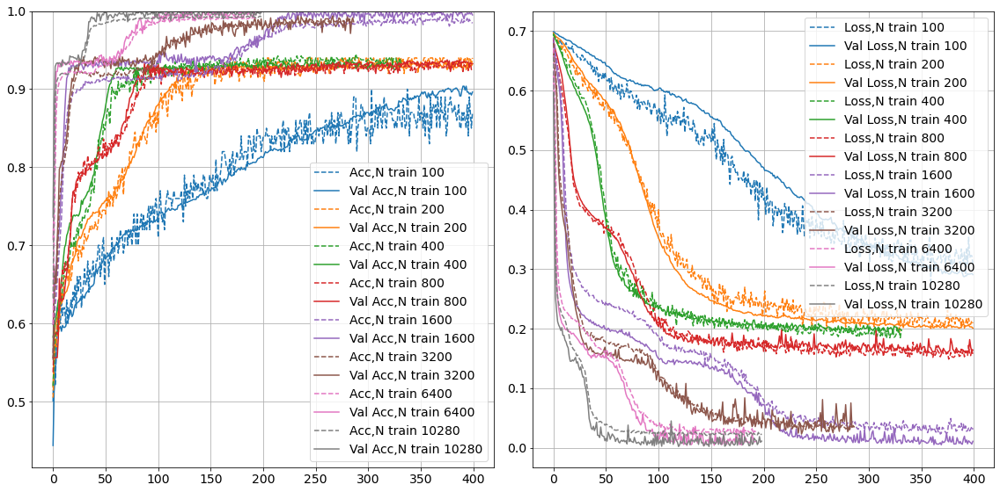

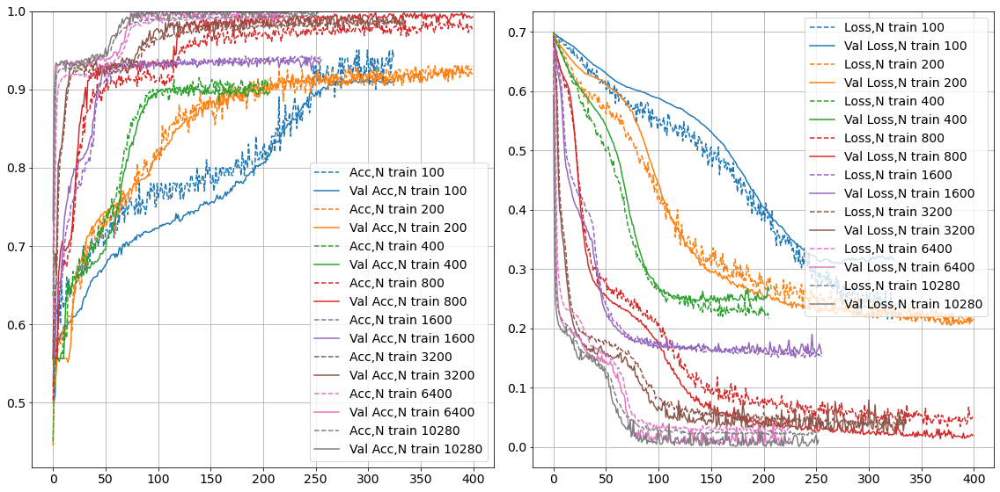

In [304]:
plot_fit_series(fits_N_train,N_trains,lambda x: f",N train {x}")
plot_fit_series(fits_N_train_2,N_trains,lambda x: f",N train {x}")

In [330]:
fits_N_train_all = []
N_trains = [100,200,400,800,1600,3200,6400,10280]
def N_train_filename(i,N_train):
    return os.path.join("saved_models","N_train",f"opt_i{i}_N{N_train}.h5")

model = create_model(hidden_layers=hidden_layer_def,number_of_nodes=number_of_nodes_def
        ,dropout=dropout_def
        ,optimizer=optimizer_def)

for i,weights in enumerate(weights_def_list):
    fits_N_train_current = []
    for N_train in N_trains:
        x_train_N,y_train_N = create_datapoints(N=N_train)
        x_train_N = rescale(x_train_N)
        model.set_weights(weights_def)
        curr_fit = model.fit(x_train_N,y_train_N,
            epochs= epochs_def, batch_size= batch_size_def,
            validation_data=(x_val,y_val),
            verbose=0,
            callbacks= callbacks_def #callbacks_def_save_func(N_train_filename(i,N_train))
            )
        fits_N_train_current.append(curr_fit
        )
    fits_N_train_all.append(fits_N_train_current)


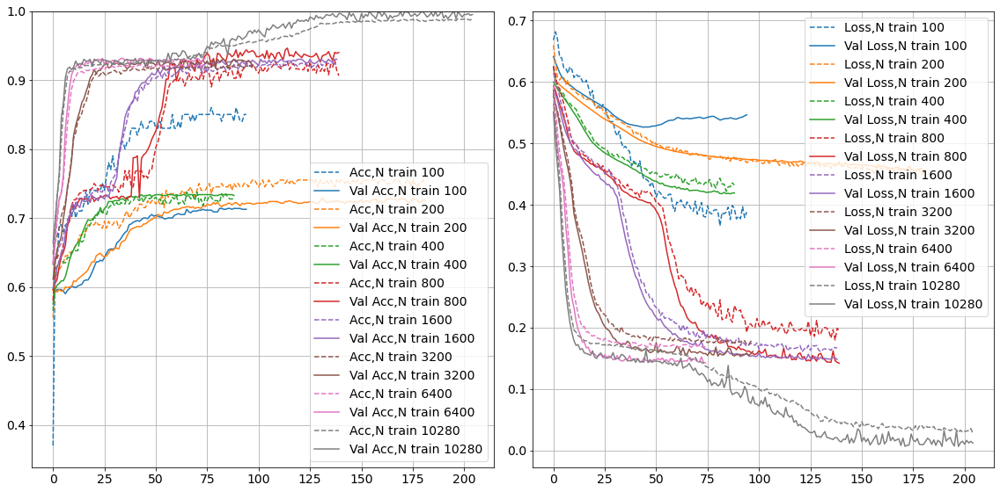

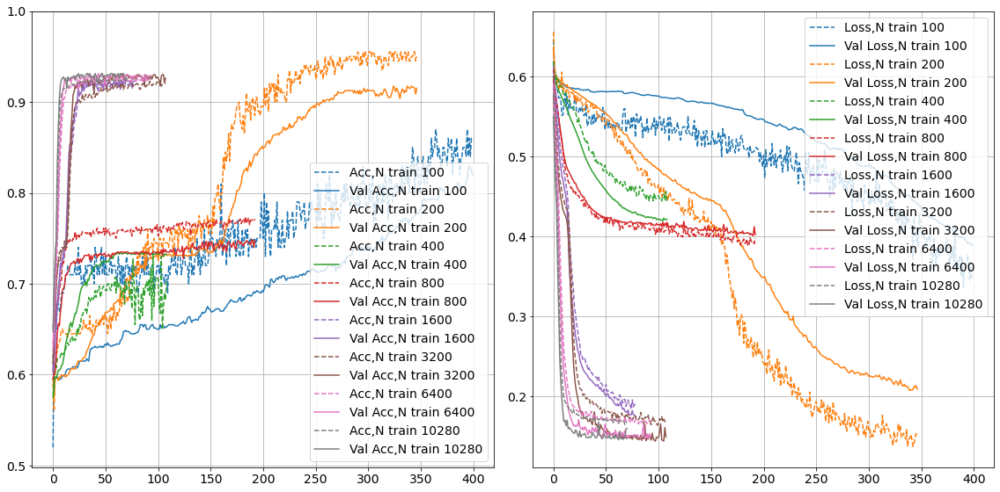

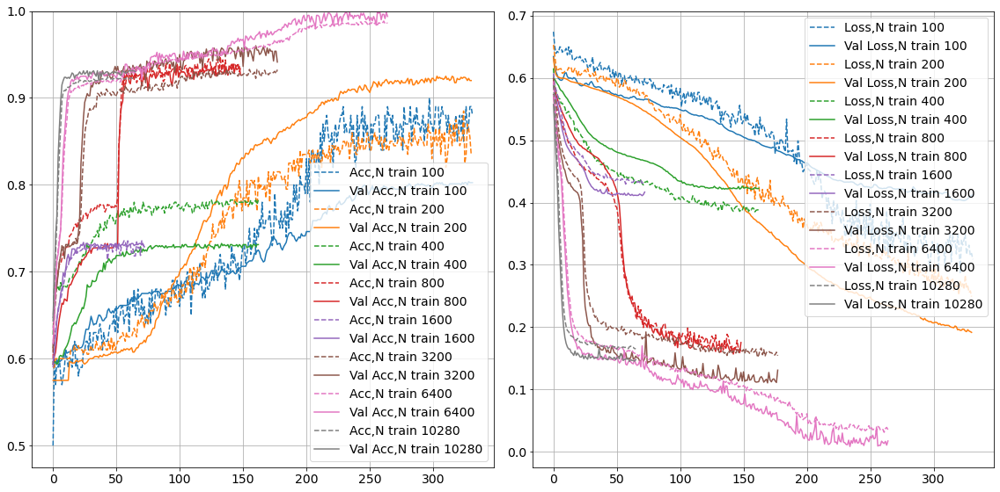

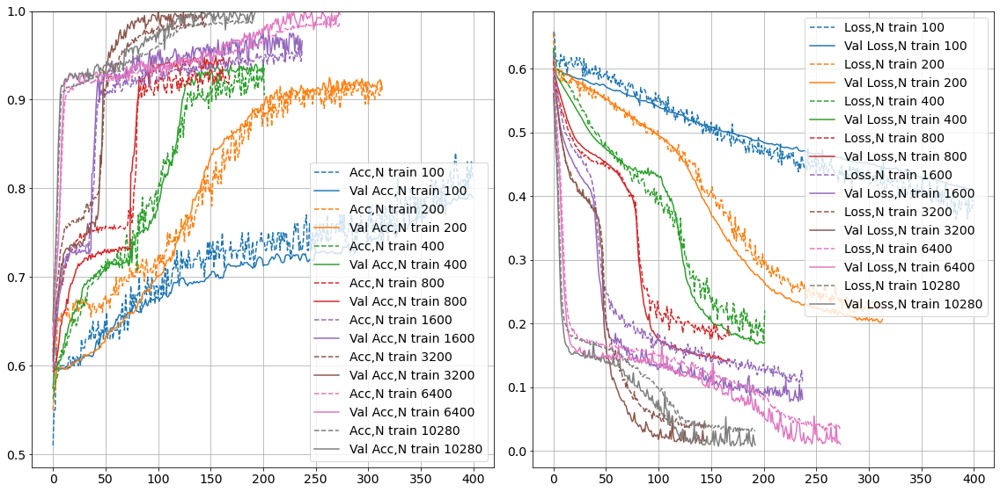

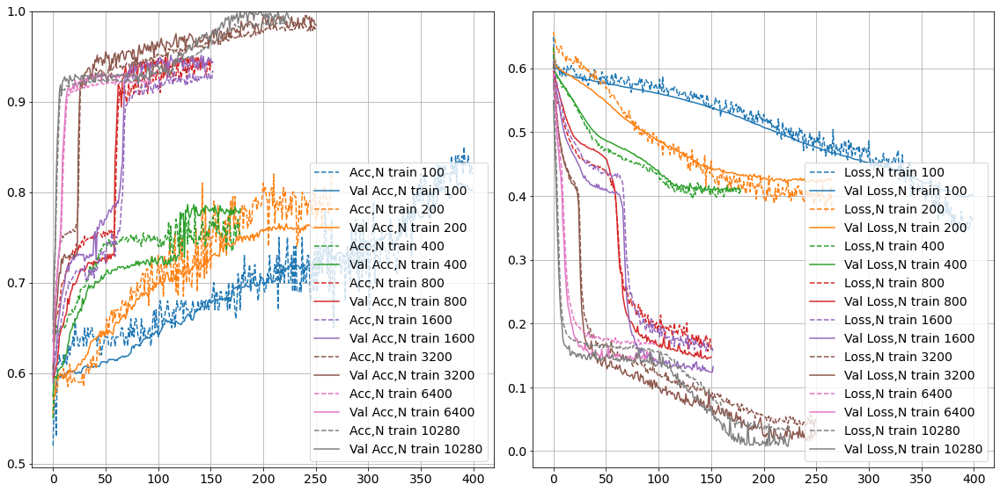

...

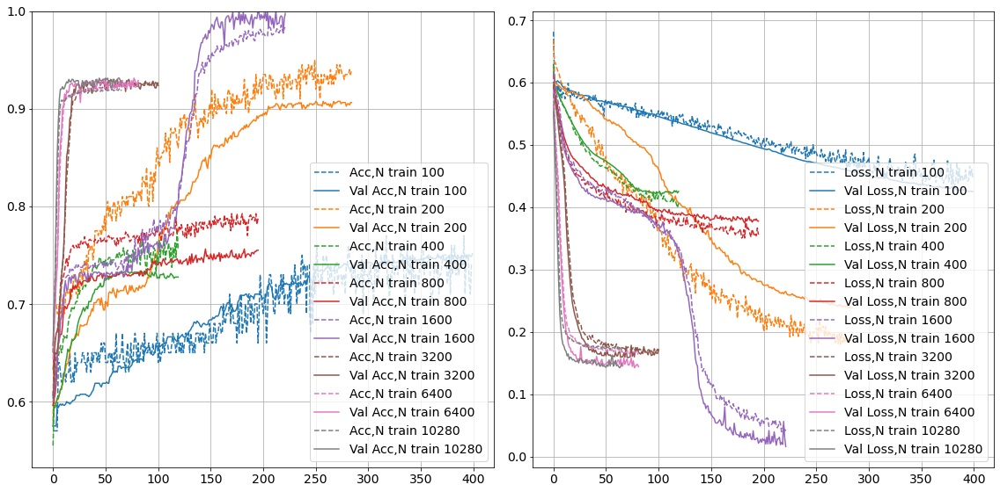

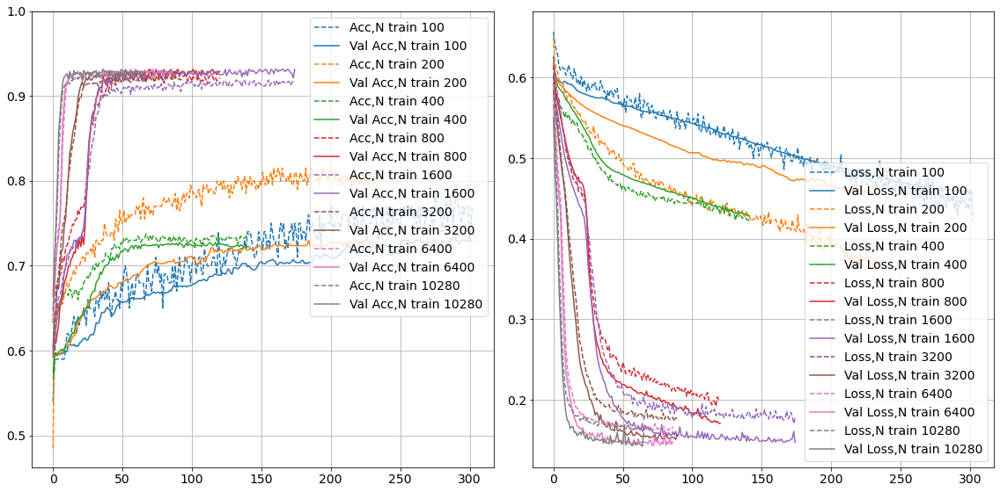

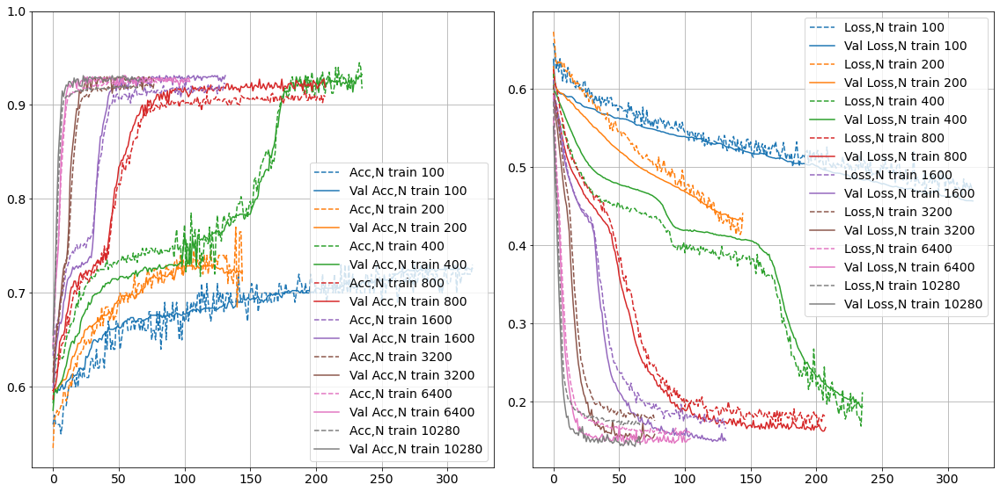

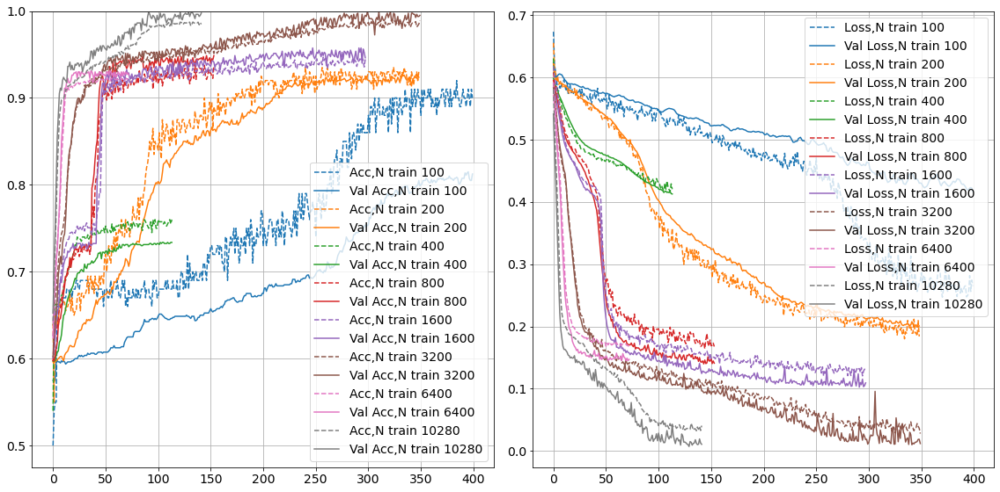

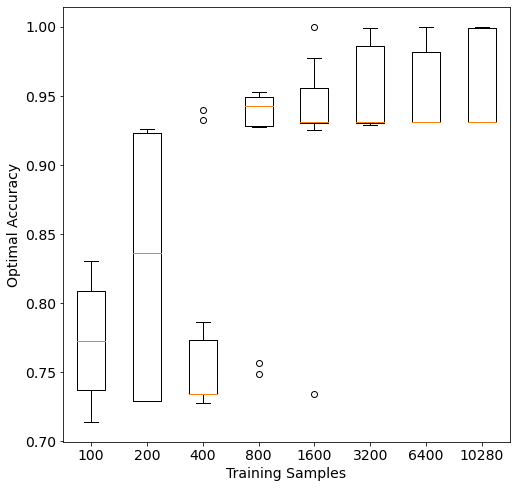

In [358]:
# fits_N_train_all = np.array(fits_N_train_all)
# np.save(os.path.join("saved_models","N_train","fits_all"),fits_N_train_all)
# fits_N_train_all = np.load(os.path.join("saved_models","N_train","fits_all.npy"),allow_pickle=True)
final_acc = np.zeros((10,len(N_trains)))

for i in range(10):
    for j in range(len(N_trains)):
        final_acc[i,j] = np.max(fits_N_train_all[i][j].history["val_accuracy"])
    plot_fit_series(fits_N_train_all[i],N_trains,lambda x: f",N train {x}")

np.save(os.path.join("saved_models","N_train","final_acc"),final_acc)
fig,ax = plt.subplots(1,1,figsize = (8,8))
# ax.set_title(r"Accuracy for varrying number of tr")
ax.boxplot(final_acc)
ax.set_xticklabels(N_trains)
ax.set_xlabel("Training Samples")
ax.set_ylabel("Optimal Accuracy")
# plt.savefig(os.path.join("figures","N_samples_box.pdf"))
plt.show()

### Agumenting the data

In [295]:
fits_agumented = []
fits_agumented_2 = []

multipliers = np.array([1,2,4,8,16])
x_train_N,y_train_N,x_val,y_val = create_datasets()

model = create_model(hidden_layers=hidden_layer_def
,number_of_nodes=number_of_nodes_def,dropout=dropout_def
,optimizer=optimizer_def)

for multiplier in multipliers:
    x_train_agumented,y_train_agumented = agument_data(x_train,y_train,multiplier=multiplier,
    epsilon=0.5e-2)      
    model.set_weights(weights_def) 
    fits_agumented.append(model.fit(x_train_N,y_train_N,
        epochs= epochs_def, batch_size= batch_size_def,
        validation_data=(x_val,y_val),
        verbose=0,
        callbacks=[es]
        )
    )

for multiplier in multipliers:
    x_train_agumented,y_train_agumented = agument_data(x_train,y_train,multiplier=multiplier,
    epsilon=0.5e-2)      
    model.set_weights(weights_def_2) 
    fits_agumented_2.append(model.fit(x_train_N,y_train_N,
        epochs= epochs_def, batch_size= batch_size_def,
        validation_data=(x_val,y_val),
        verbose=0,
        callbacks=[es]
        )
    )

1.9999980926513672


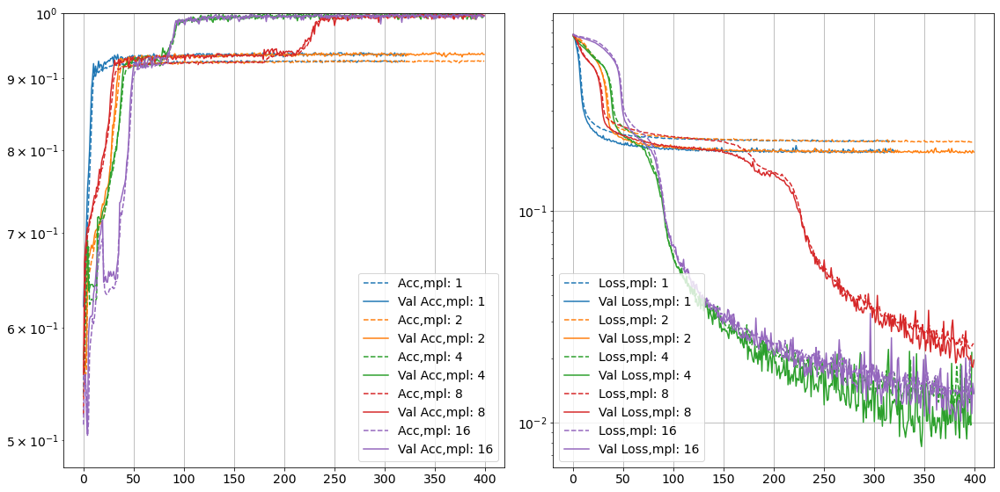

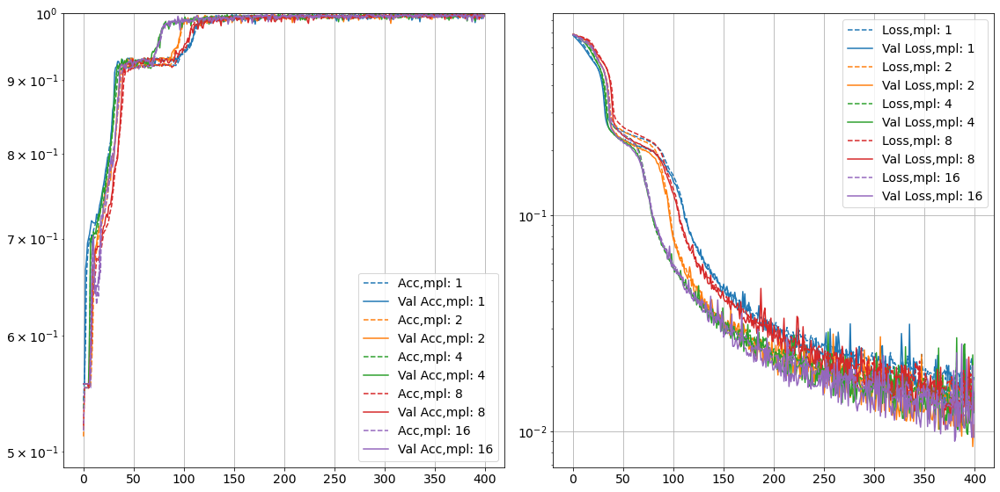

In [301]:
plot_fit_series(fits_agumented,multipliers,lambda x: f",mpl: {x}",yscale='log')
plot_fit_series(fits_agumented_2,multipliers,lambda x: f",mpl: {x}",yscale='log')


### Dropouts

In [211]:
fits_dropout = []
dropouts = [0,0.1,0.2,0.3]
for dropout in dropouts:
    model = create_model(hidden_layers=hidden_layer_def
    ,number_of_nodes=number_of_nodes_def
    ,dropout=dropout
    ,optimizer=optimizer_def)
    model.set_weights(weights_def) 
    fits_dropout.append(model.fit(x_train,y_train,
        epochs= epochs_def, batch_size= batch_size_def,
        validation_data=(x_val,y_val),
        verbose=0,
        callbacks=[es]
        )
    )

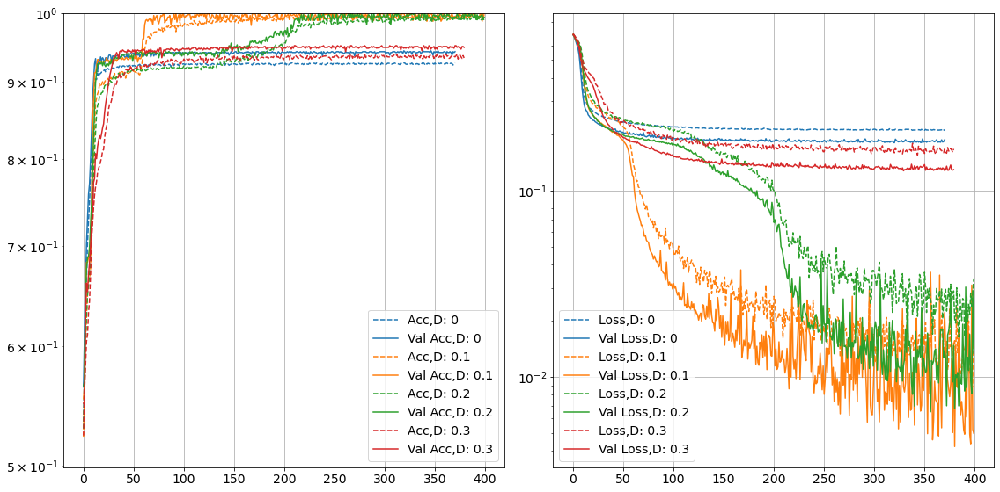

In [219]:
plot_fit_series(fits_dropout,dropouts,lambda x: f",D: {x}")

Looks like the optimal choice is to have a bit of uncertianty in what nodes are active, here it seems like 0.1 is optimal

### Optimizer

In [220]:
fits_optimizer = []
optimizers = ['SGD', 'RMSprop', 'Adagrad', 'Adadelta', 'Adam']
for optimizer in optimizers:
    model = create_model(hidden_layers=hidden_layer_def
    ,number_of_nodes=number_of_nodes_def,dropout=dropout_def
    ,optimizer=optimizer)
    model.set_weights(weights_def) 
    fits_optimizer.append(model.fit(x_train,y_train,
        epochs= epochs_def, batch_size= batch_size_def,
        validation_data=(x_val,y_val),
        verbose=0,
        callbacks=[es]
        )
    )

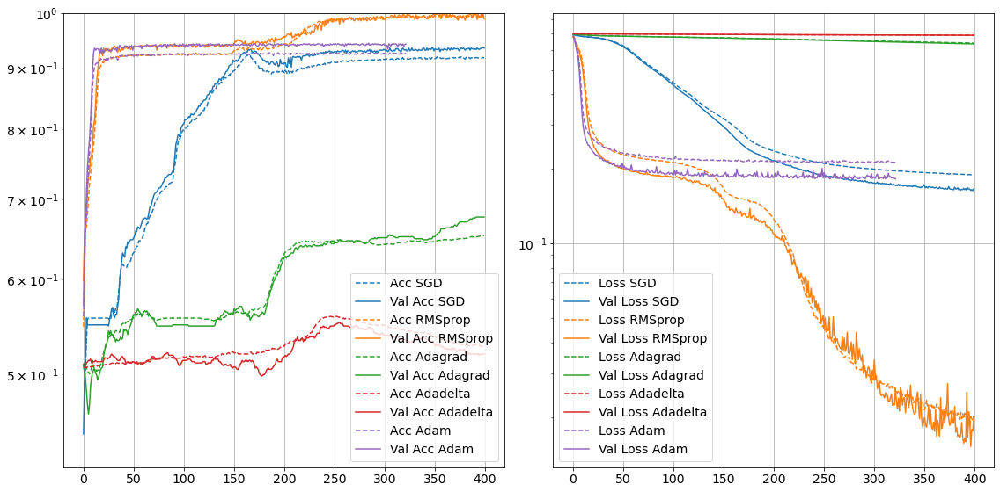

In [221]:
plot_fit_series(fits_optimizer,optimizers,lambda x: f" {x}")

### Activation

In [222]:
fits_activation = []
activations = ['relu','sigmoid','softmax','tanh','selu','elu']
for activation in activations:
    model = create_model(hidden_layers=hidden_layer_def
    ,number_of_nodes=number_of_nodes_def,dropout=dropout_def
    ,activation_hidden_layers=activation,optimizer=optimizer_def)
    model.set_weights(weights_def) 
    fits_activation.append(model.fit(x_train,y_train,
        epochs= epochs_def, batch_size= batch_size_def,
        validation_data=(x_val,y_val),
        verbose=0,
        callbacks=[es]
        )
    )

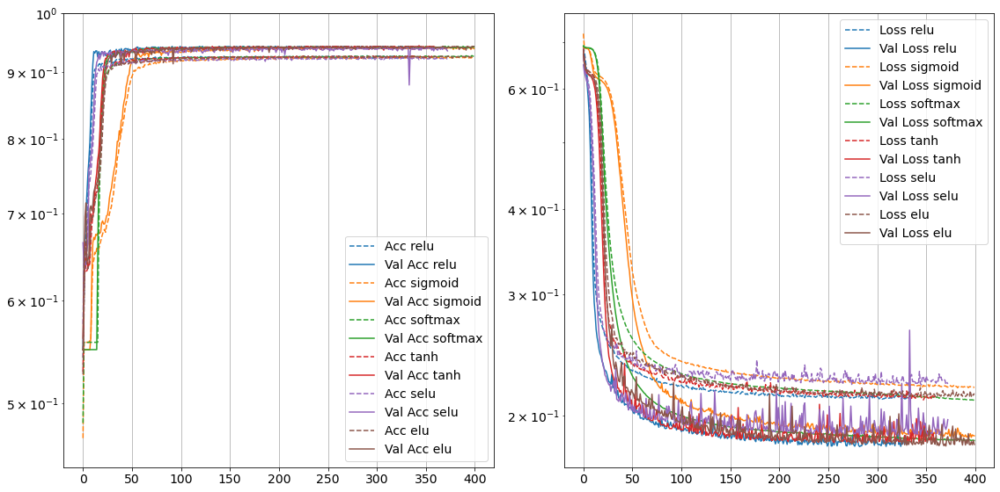

In [226]:
plot_fit_series(fits_activation,activations,lambda x: f" {x}",yscale='log')

### Batch Size

In [227]:
fits_batch_size = []
batch_sizes = [1,4,16,64,128,256]
for batch_size in batch_sizes:
    model = create_model(hidden_layers=hidden_layer_def
    ,number_of_nodes=number_of_nodes_def,dropout=dropout_def
    ,optimizer=optimizer_def
    )
    model.set_weights(weights_def) 
    fits_batch_size.append(model.fit(x_train,y_train,
        epochs= epochs_def, batch_size= batch_size,
        validation_data=(x_val,y_val),
        verbose=0,
        callbacks=[es]
        )
    )

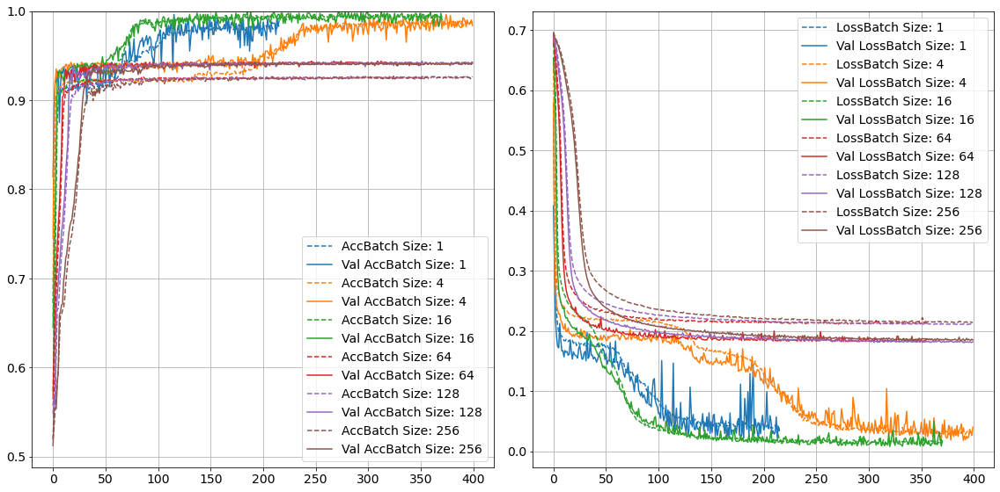

In [236]:
plot_fit_series(fits_batch_size,batch_sizes,lambda x: f"Batch Size: {x}",yscale='linear')

### Number of layers

In [235]:
N = 4000
N_train = 3200

multipliers = np.array([1,2,4,8,16])
epsilons = np.array([0,1e-5,1e-4,1e-3,1e-2,1e-1,1])

N_check = 10

avg_array = np.zeros((N_check,multipliers.size,epsilons.size))    
model = create_model(hidden_layers=hidden_layer_def
                    ,number_of_nodes=number_of_nodes_def,
                    dropout=dropout_def,optimizer=optimizer_def)

for n in range(N_check):
    model = create_model(hidden_layers=hidden_layer_def
                    ,number_of_nodes=number_of_nodes_def,
                    dropout=dropout_def,optimizer=optimizer_def)
    round_weights = model.weights
    for i,multiplier in enumerate(multipliers):
        if i == 0:
            # The epsilons has noe effect when it is one
            model.set_weights(round_weights)
            aug_fit = model.fit(x_train,y_train,
                epochs= epochs, batch_size= batch_size,
                validation_data=(x_valid,y_valid),
                verbose=0,
                callbacks=[es]
                )
            aug_avg,aug_std = fit_stat(aug_fit)      

            avg_array[n,0,:] = aug_avg*np.ones(epsilons.size)
        else:
            for j,epsilon in enumerate(epsilons):
                x_train_agumented,y_train_agumented = agument_data(x_train,y_train,multiplier=multiplier,epsilon=epsilon)
                model.set_weights(round_weights)
                aug_fit = model.fit(x_train_agumented,y_train_agumented,
                    epochs= epochs, batch_size= batch_size,
                    validation_data=(x_valid,y_valid),
                    verbose=0,
                    callbacks=[es]
                    )
                aug_avg,aug_std = fit_stat(aug_fit)        
                
                avg_array[n,i,j] = aug_avg

KeyboardInterrupt: 

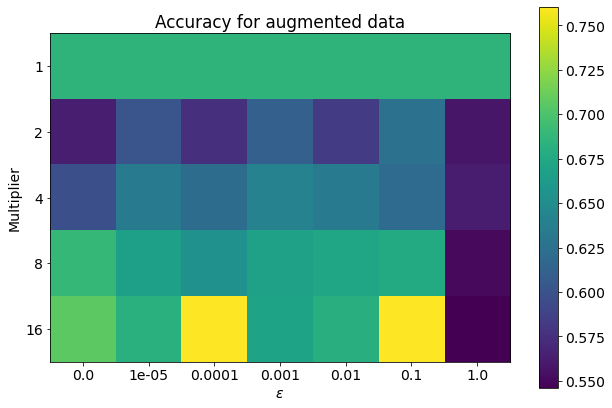

ValueError: The number of FixedLocator locations (1), usually from a call to set_ticks, does not match the number of ticklabels (5).

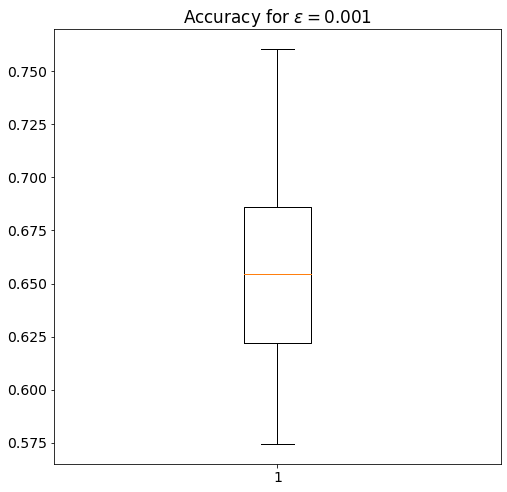

In [ ]:
avg_flatten_array = np.average(avg_array,axis=0)

fig, ax = plt.subplots(figsize=(9,6))
im = ax.imshow(avg_flatten_array)
plt.colorbar(im)

# Show all ticks and label them with the respective list entries

ax.set_title("Accuracy for augmented data")
ax.set_xlabel(r"$\epsilon$")
ax.set_xticks(np.arange(len(epsilons)))#), labels=epsilons)
ax.set_xticklabels(epsilons)
ax.set_ylabel("Multiplier")
ax.set_yticks(np.arange(len(multipliers)))#, labels=multipliers)
ax.set_yticklabels(multipliers)
plt.tight_layout()
plt.savefig(os.path.join("figures","aug_samples_acc.pdf"))
plt.show()


fig,ax = plt.subplots(1,1,figsize = (8,8))
ax.set_title(r"Accuracy for $\epsilon = 0.001$")
ax.boxplot(avg_array[:,2])
ax.set_xticklabels(multipliers)
ax.set_xlabel("Multiplier")
ax.set_ylabel("Accuracy")
plt.show()

fig,ax = plt.subplots(1,1,figsize = (8,8))
ax.set_title(r"Accuracy for multiplier of 16")
ax.boxplot(avg_array[-2,:])
ax.set_xticklabels(epsilons)
ax.set_xlabel(r"$\epsilon$")
ax.set_ylabel("Accuracy")
plt.show()

## Grid Search


### Arcitecture

In [98]:
epochs = 400
batch_size = 16
N_train = 3200
N_valid = 800
es_acc = EarlyStopping(monitor="val_accuracy",patience=50,mode='max',min_delta=2/N_valid)

hidden_layers = [2,3,4]
number_of_nodes = [10,20,40,80]
dropouts = [0, 0.1]
activations = ['relu', 'sigmoid','elu']


param_grid = dict(hidden_layers =hidden_layers,
    number_of_nodes = number_of_nodes,
    dropout = dropouts,
    activation_hidden_layers = activations
)


x_train,y_train,x_valid,y_valid = create_datasets(N_train=N_train,N_valid= N_valid) # No validation



model_arcitecture_search = KerasClassifier(build_fn=create_model,
    verbose = 0)

grid_arcitecture = GridSearchCV(model_arcitecture_search,
    param_grid = param_grid,
    n_jobs=-1 )

grid_arcitecture_result = grid_arcitecture.fit(x_train,y_train,
    epochs = epochs,
    batch_size = batch_size,
    validation_data=(x_valid,y_valid)
    ,callbacks = [es_acc])


In [111]:
# summarize results
print("Best: %f using %s" % (grid_arcitecture_result.best_score_, grid_arcitecture_result.best_params_))

means = grid_arcitecture_result.cv_results_['mean_test_score']
stds = grid_arcitecture_result.cv_results_['std_test_score']
params = np.array(grid_arcitecture_result.cv_results_['params'])
print(type(params))
permutation = means.argsort()
means = means[permutation]
stds = stds[permutation]
params = params[permutation]
i = -10
for mean, stdev, param in zip(means[i:], stds[i:], params[i:]):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.977187 using {'activation_hidden_layers': 'relu', 'dropout': 0, 'hidden_layers': 4, 'number_of_nodes': 10}
<class 'numpy.ndarray'>
0.956250 (0.042859) with: {'activation_hidden_layers': 'relu', 'dropout': 0.1, 'hidden_layers': 2, 'number_of_nodes': 80}
0.959063 (0.031737) with: {'activation_hidden_layers': 'relu', 'dropout': 0, 'hidden_layers': 4, 'number_of_nodes': 80}
0.965312 (0.025947) with: {'activation_hidden_layers': 'relu', 'dropout': 0.1, 'hidden_layers': 4, 'number_of_nodes': 20}
0.966563 (0.026929) with: {'activation_hidden_layers': 'relu', 'dropout': 0, 'hidden_layers': 4, 'number_of_nodes': 40}
0.971875 (0.024705) with: {'activation_hidden_layers': 'relu', 'dropout': 0, 'hidden_layers': 3, 'number_of_nodes': 40}
0.973437 (0.027368) with: {'activation_hidden_layers': 'relu', 'dropout': 0.1, 'hidden_layers': 4, 'number_of_nodes': 40}
0.973750 (0.012938) with: {'activation_hidden_layers': 'relu', 'dropout': 0, 'hidden_layers': 3, 'number_of_nodes': 80}
0.973750 (0.024

In [137]:
N_check = 10
params_top3 = [grid_arcitecture_result.cv_results_['params'][permutation[i]] for i in range(-3,0)] 
models = []
fits = []

best_acc = np.zeros((N_check,len(params_top3)))
# create_model(params[0])
for n in range(N_check):
    for i,params_top in enumerate(params_top3):
        models.append(create_model(activation_hidden_layers=params_top["activation_hidden_layers"],
            dropout=params_top["dropout"],
            hidden_layers=params_top["hidden_layers"],
            number_of_nodes=params_top["number_of_nodes"]))
        fits.append(models[-1].fit(x_train,y_train,
            epochs = epochs,
            batch_size = batch_size,
            validation_data=(x_valid,y_valid)
            ,callbacks = [es_acc],
            verbose = 0))
        best_acc[n,i] = np.max(fits[-1].history["val_accuracy"])
        

0.9748749911785126 0.03328123380007278 {'activation_hidden_layers': 'relu', 'dropout': 0, 'hidden_layers': 4, 'number_of_nodes': 20}
0.9792499959468841 0.02853834025474572 {'activation_hidden_layers': 'relu', 'dropout': 0, 'hidden_layers': 2, 'number_of_nodes': 80}
0.9608749985694885 0.03640505434782711 {'activation_hidden_layers': 'relu', 'dropout': 0, 'hidden_layers': 4, 'number_of_nodes': 10}


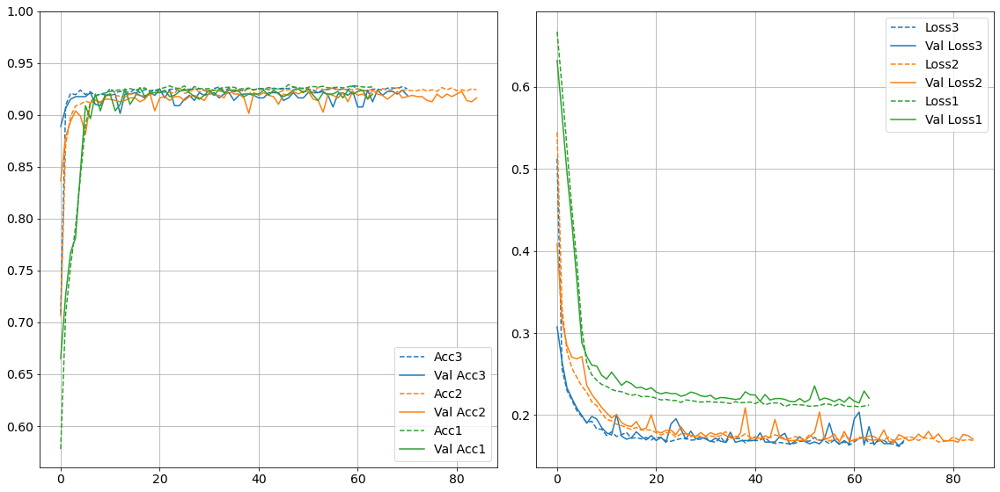

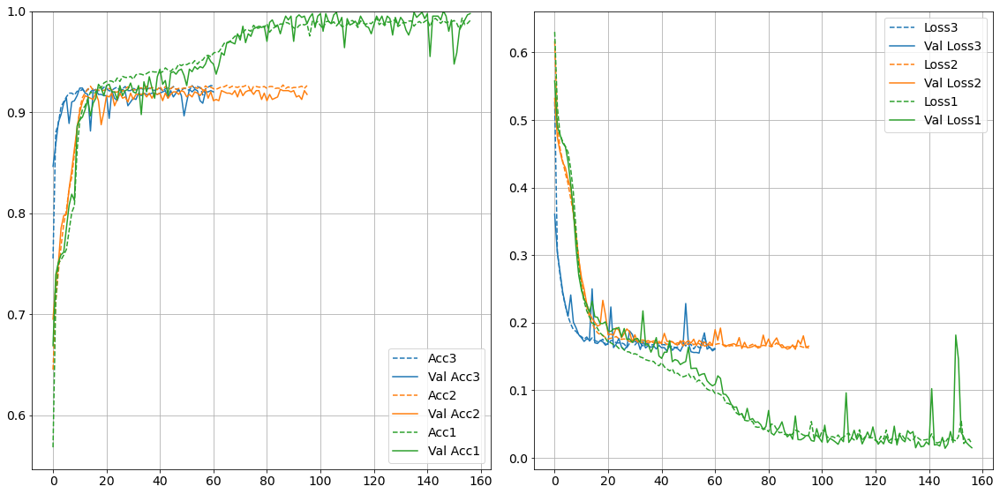

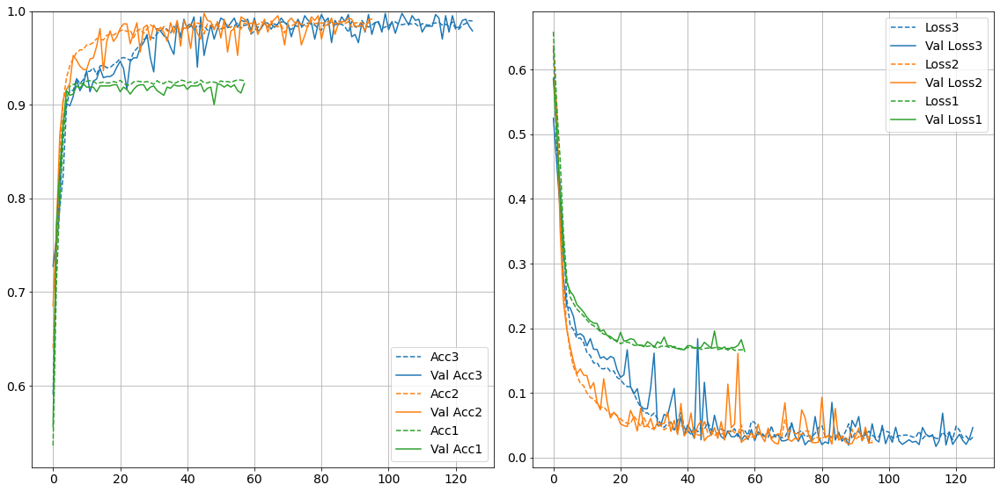

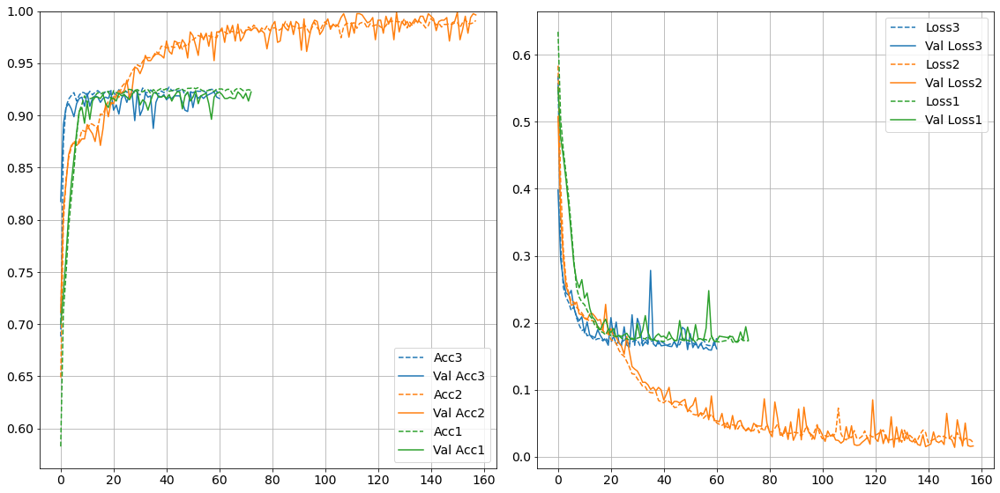

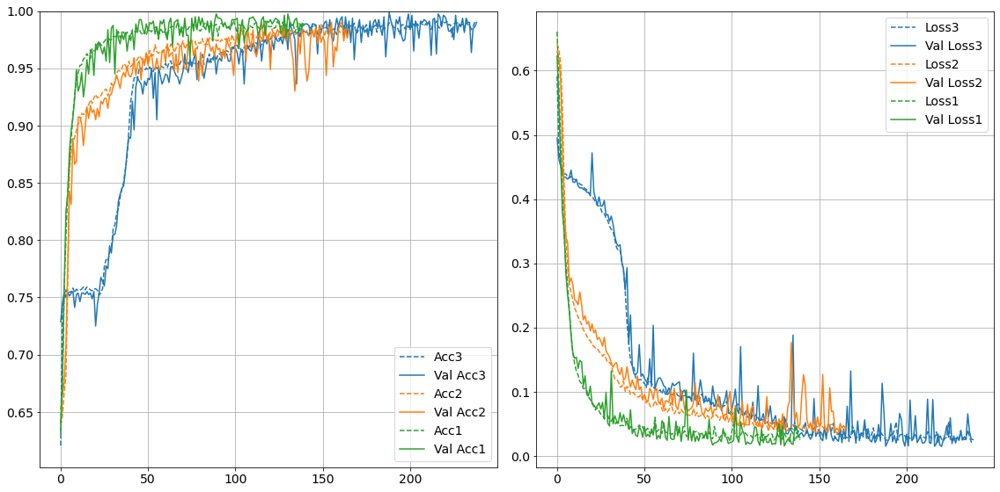

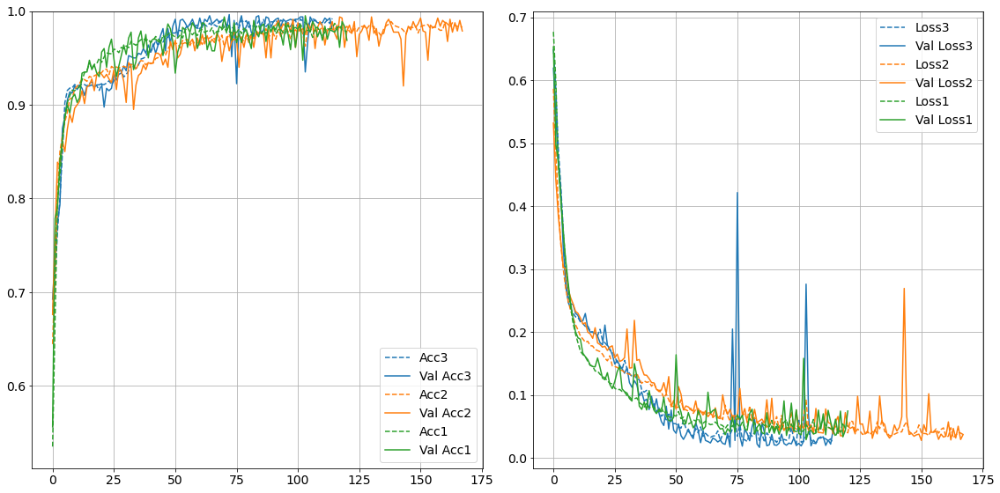

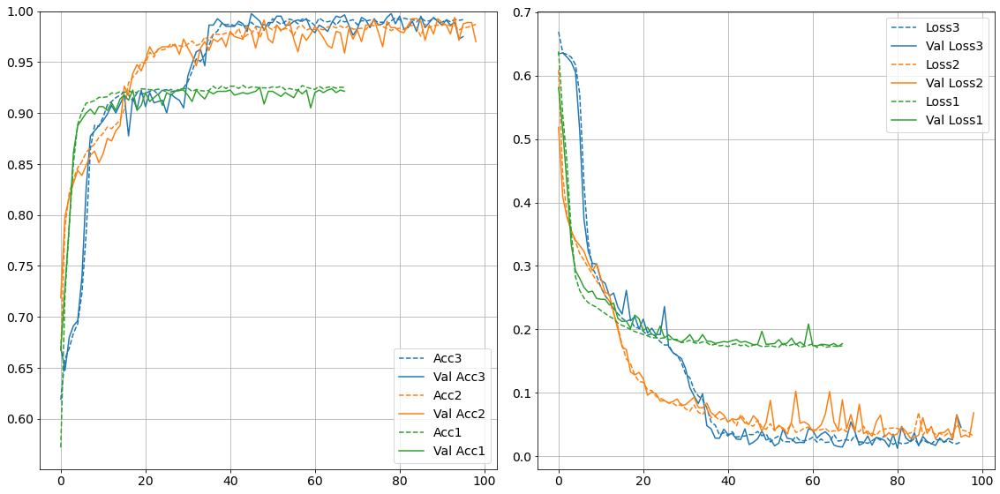

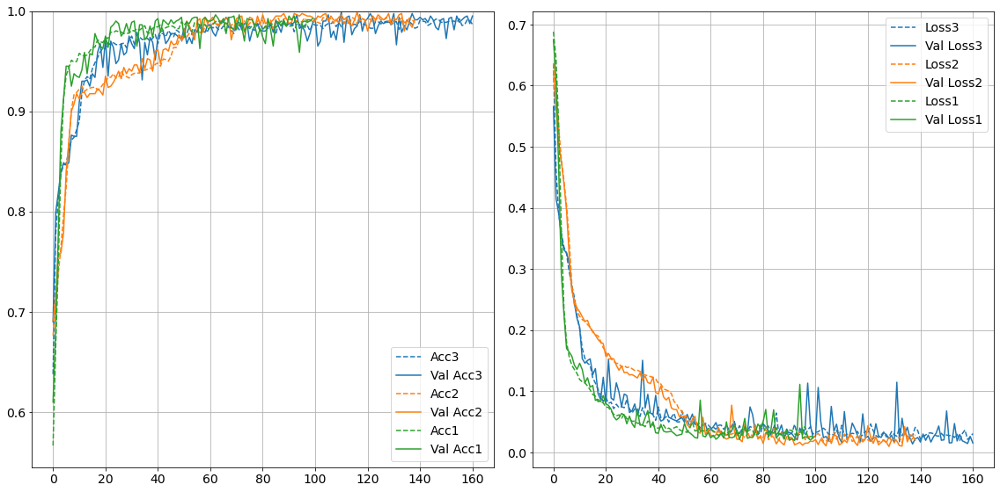

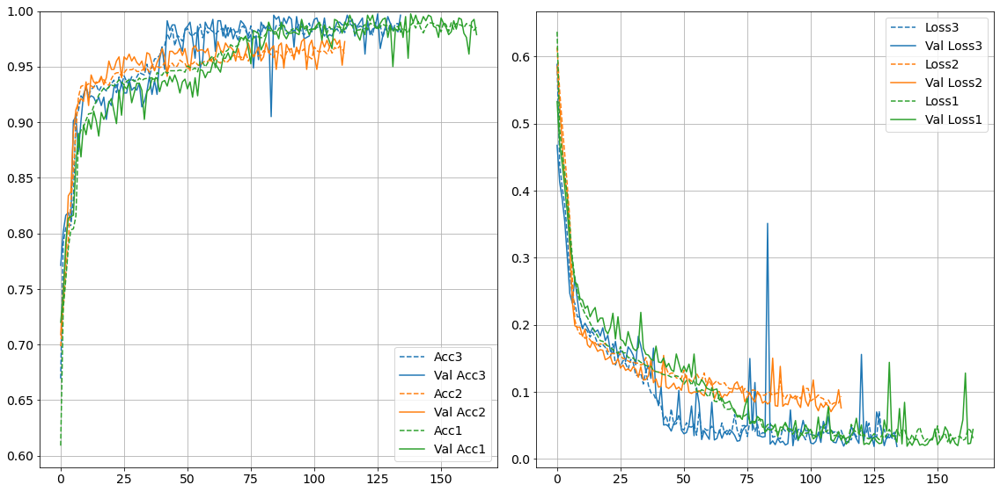

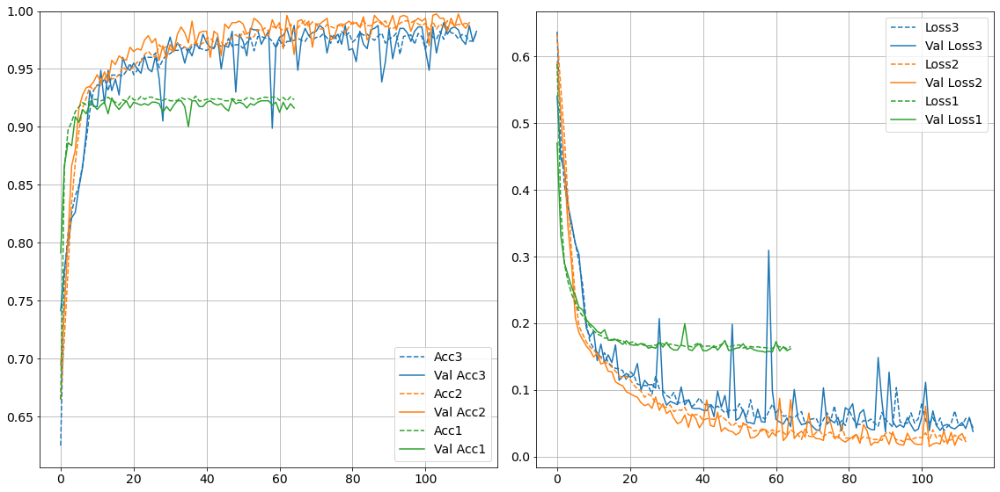

In [145]:
num = np.arange(3,0,-1)
for i in range(3):
    print(np.average(best_acc[:,i]),np.std(best_acc[:,i]),params_top3[i])
# num = np.arange(0,len(fits))
for n in range(N_check):
    plot_fit_series(fits[n*3:],num,lambda x: f"{x}")


### Training

In [17]:
N_train = 3200
N_valid = 800
hidden_layers = 4
number_of_nodes = 10
activation = 'relu'
dropout = 0
es_acc = EarlyStopping(monitor="val_accuracy",patience=50,mode='max',min_delta=2/N_valid)

batch_size = [16,64,128]
# batch_size = 128
optimizers = ['Adam']
epochs = [100,200,400]

param_grid = dict(
    batch_size =batch_size,
    optimizer = optimizers,
    epochs = epochs
)


x_train,y_train,x_valid,y_valid = create_datasets(N_train=N_train,N_valid= N_valid) # No validation



model_arcitecture_search = KerasClassifier(build_fn=create_model,
    verbose = 0,
    hidden_layers = hidden_layers,
    number_of_nodes = number_of_nodes,
    activation_hidden_layers = activation,
    dropout = dropout,
    )

grid_arcitecture = GridSearchCV(model_arcitecture_search,
    param_grid = param_grid,
    # n_jobs=-1,
    verbose=0
     )

grid_arcitecture_result = grid_arcitecture.fit(x_train,y_train,
    validation_data=(x_valid,y_valid)
    ,callbacks = [es_acc],
    verbose = 0)


In [18]:
# summarize results
print("Best: %f using %s" % (grid_arcitecture_result.best_score_, grid_arcitecture_result.best_params_))

means = grid_arcitecture_result.cv_results_['mean_test_score']
stds = grid_arcitecture_result.cv_results_['std_test_score']
params = np.array(grid_arcitecture_result.cv_results_['params'])
permutation = means.argsort()
means = means[permutation]
stds = stds[permutation]
params = params[permutation]
i = -10
for mean, stdev, param in zip(means[i:], stds[i:], params[i:]):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.982188 using {'batch_size': 128, 'epochs': 400, 'optimizer': 'Adam'}
0.923750 (0.051571) with: {'batch_size': 128, 'epochs': 100, 'optimizer': 'Adam'}
0.933750 (0.011163) with: {'batch_size': 64, 'epochs': 100, 'optimizer': 'Adam'}
0.937500 (0.027333) with: {'batch_size': 64, 'epochs': 200, 'optimizer': 'Adam'}
0.939062 (0.024146) with: {'batch_size': 128, 'epochs': 200, 'optimizer': 'Adam'}
0.942500 (0.024154) with: {'batch_size': 16, 'epochs': 100, 'optimizer': 'Adam'}
0.949687 (0.033866) with: {'batch_size': 64, 'epochs': 400, 'optimizer': 'Adam'}
0.953750 (0.028889) with: {'batch_size': 16, 'epochs': 200, 'optimizer': 'Adam'}
0.958438 (0.025743) with: {'batch_size': 16, 'epochs': 400, 'optimizer': 'Adam'}
0.982188 (0.008125) with: {'batch_size': 128, 'epochs': 400, 'optimizer': 'Adam'}


In [19]:
N_check = 10
params_top3 = [grid_arcitecture_result.cv_results_['params'][permutation[i]] for i in range(-3,0)] 
models = []
fits = []

best_acc = np.zeros((N_check,len(params_top3)))
# create_model(params[0])
for n in range(N_check):
    for i,params_top in enumerate(params_top3):
        models.append(create_model(activation_hidden_layers=activation,
            dropout=dropout,
            hidden_layers=hidden_layers,
            number_of_nodes=number_of_nodes,
            optimizer = params_top["optimizer"],
            ))
        fits.append(models[-1].fit(x_train,y_train,
            epochs = params_top["epochs"],
            batch_size = params_top["batch_size"],
            validation_data=(x_valid,y_valid)
            ,callbacks = [es_acc],
            verbose = 0))
        best_acc[n,i] = np.max(fits[-1].history["val_accuracy"])

0.9731249988079071 0.03647879038266186 {'batch_size': 16, 'epochs': 200, 'optimizer': 'Adam'}
0.9427500009536743 0.03206339751209367 {'batch_size': 16, 'epochs': 400, 'optimizer': 'Adam'}
0.9560000002384186 0.03933349597707168 {'batch_size': 128, 'epochs': 400, 'optimizer': 'Adam'}


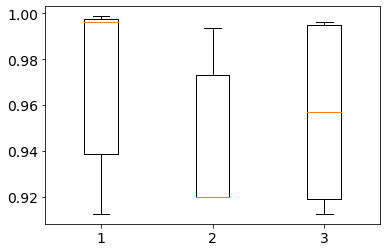

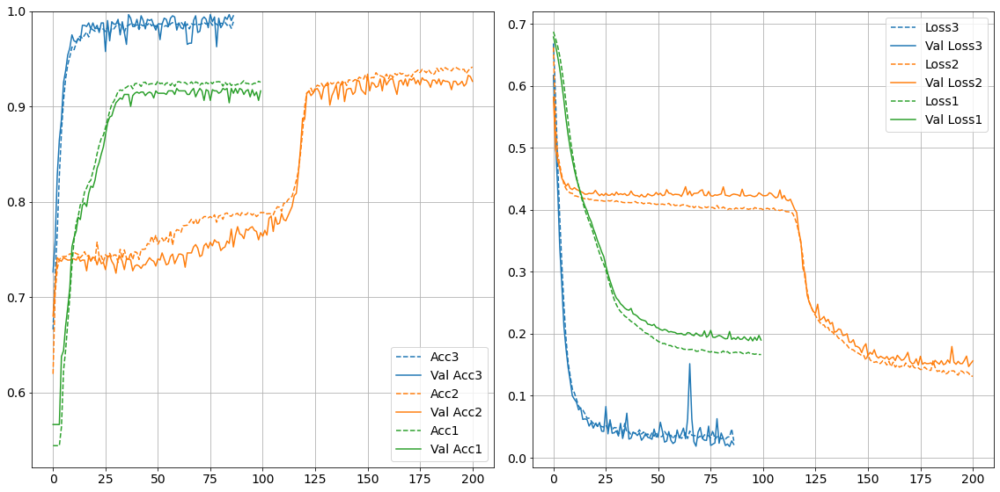

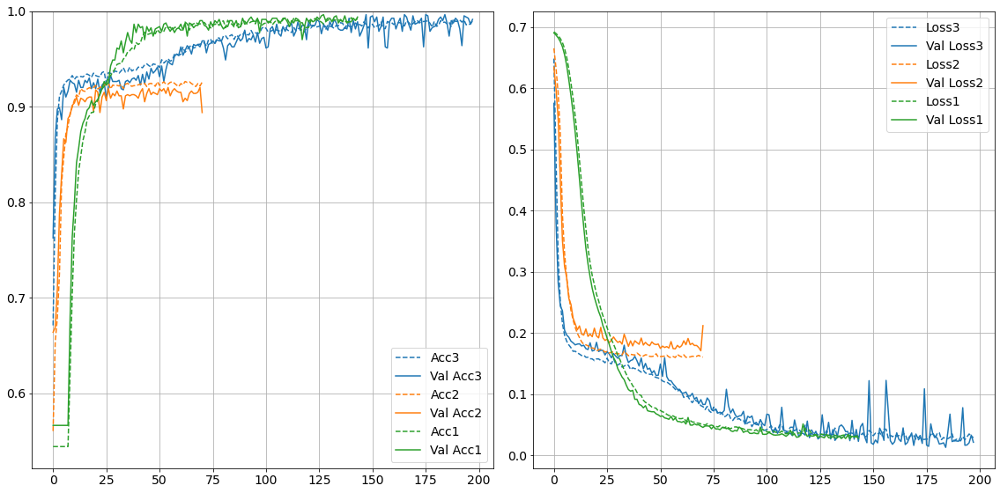

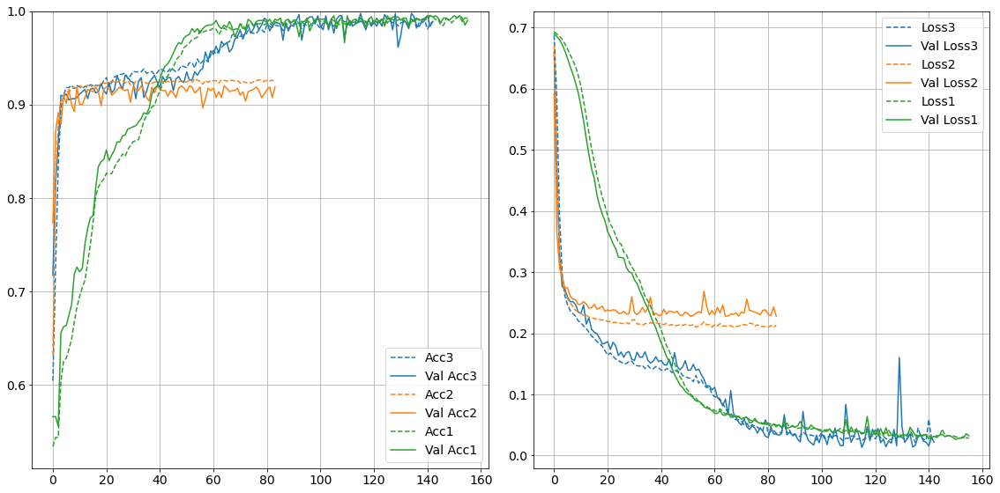

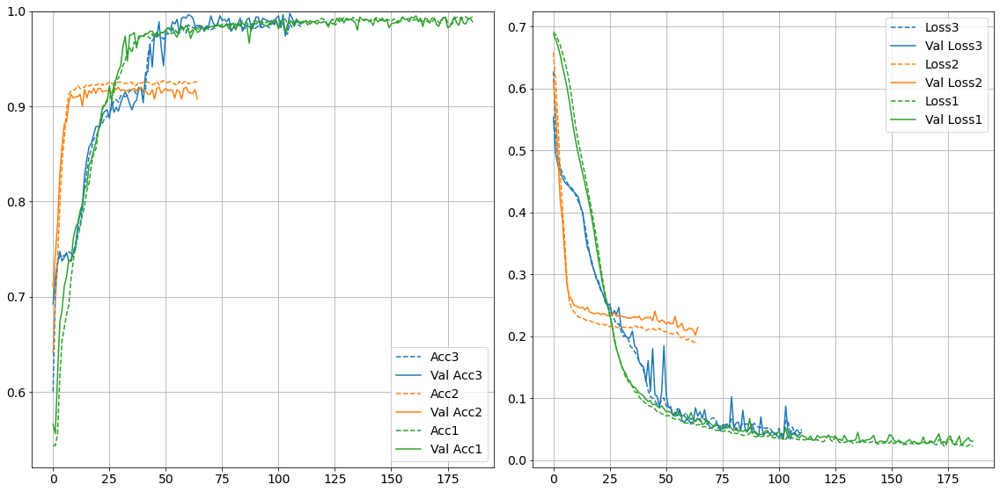

...

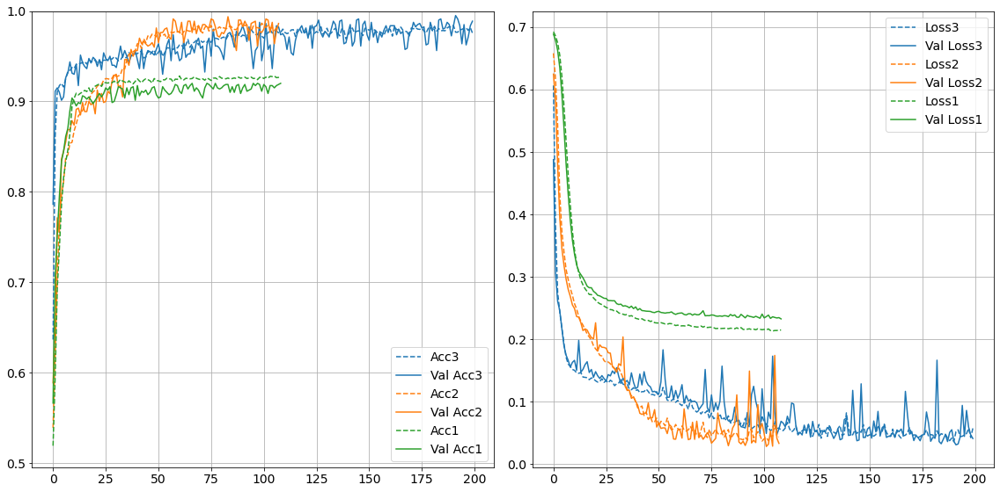

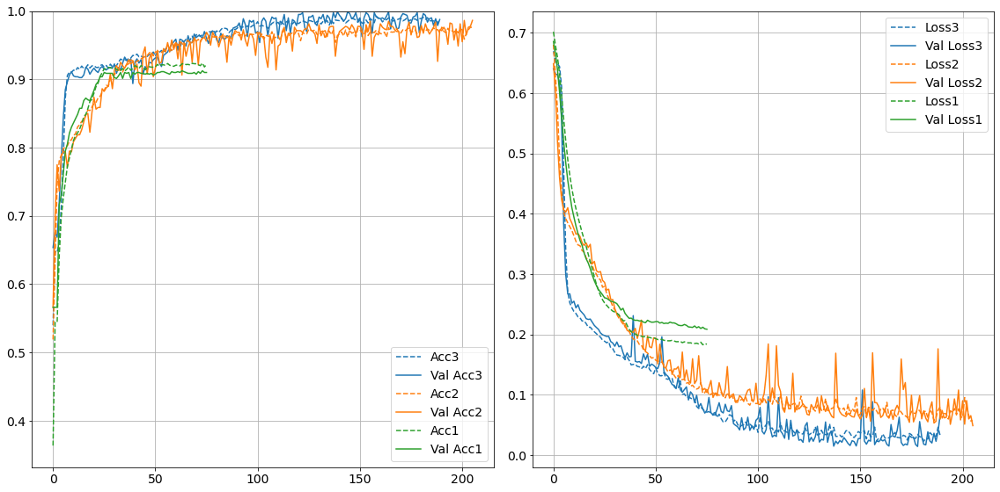

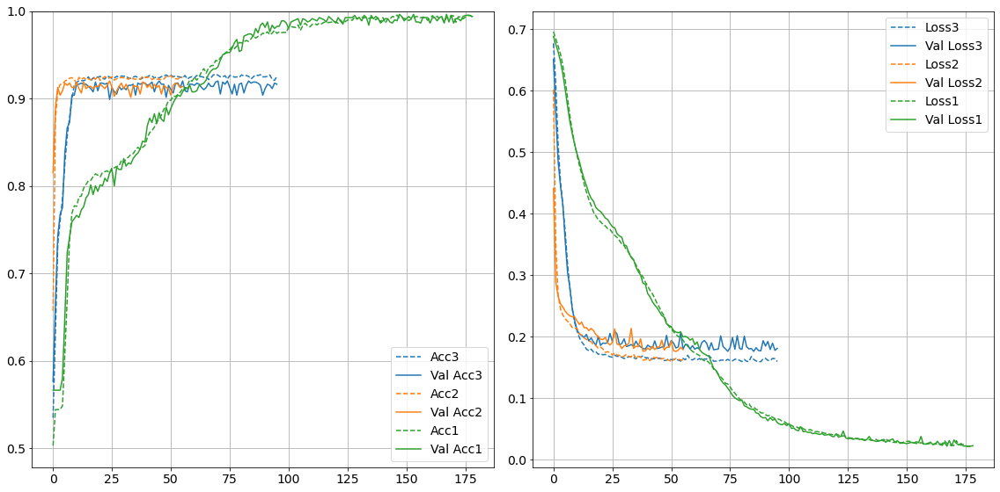

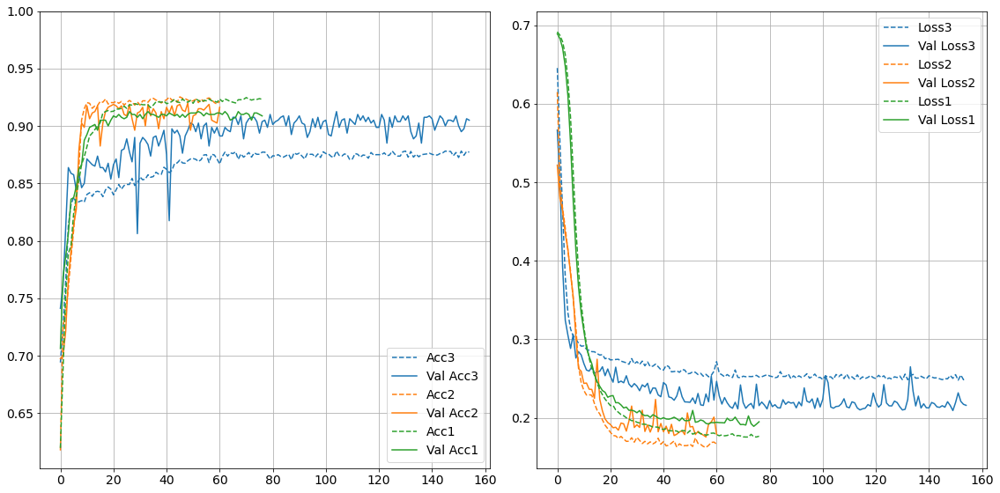

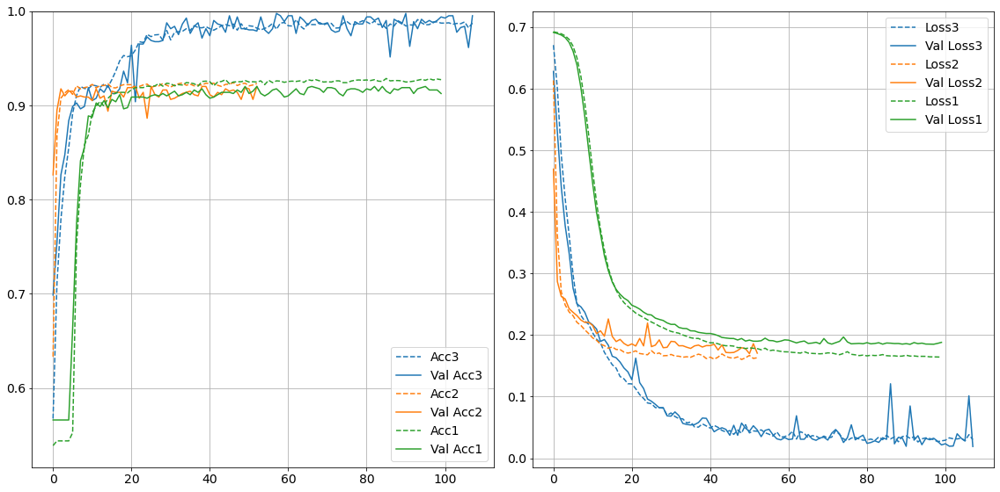

In [24]:
num = np.arange(3,0,-1)
for i in range(3):
    print(np.average(best_acc[:,i]),np.std(best_acc[:,i]),params_top3[i])
# num = np.arange(0,len(fits))
plt.boxplot(best_acc)
plt.show()
for n in range(N_check):
    plot_fit_series(fits[n*3:],num,lambda x: f"{x}")

## Different Rescaling

In [53]:
number_of_nodes = 10
hidden_layers = 4
N_train = 3200
N_valid = 800
hidden_layers = 4
number_of_nodes = 10
activation = 'relu'
dropout = 0
es_acc = EarlyStopping(monitor="val_accuracy",patience=50,mode='max',min_delta=2/N_valid)
epochs = 100
batch_size = 16
N_check = 10

def normalize(x,x_ref):
    x_out = np.zeros(x.shape)
    for i in range(2):
        x_out[:,i] = (x[:,i]-np.max(x_ref[:,i]))/(-np.max(x_ref[:,i])+np.min(x_ref[:,i]))*2-1
    return x_out

def standarize(x,x_ref):
    x_out = np.zeros(x.shape)
    for i in range(2):
        x_out[:,i] = (x[:,i]-np.mean(x_ref[:,i]))/(np.std(x[:,i]))
    return x_out


x,y = create_datapoints(N = N_train+N_valid)

x_t, y_train = x[:N_train],y[:N_train]
x_valid, y_valid = x[N_train:],y[N_train:]

x_train_norm  = normalize(x_t,x_t)
x_valid_norm = normalize(x_valid,x_t)

x_train_st  = standarize(x_t,x_t)
x_valid_st = standarize(x_valid,x_t)

model = create_model(dropout=dropout,
        hidden_layers=hidden_layers,
        number_of_nodes=number_of_nodes,
        activation_hidden_layers=activation,
        )


fits_norm = []
fits_st = []
for n in range(N_check):
    model = create_model(dropout=dropout,
        hidden_layers=hidden_layers,
        number_of_nodes=number_of_nodes,
        activation_hidden_layers=activation,
        )
    model.load_weights(weights_file(n))
    
    fits_norm.append(model.fit(
        x_train_norm,y_train,
        epochs = epochs,
        batch_size = batch_size,
        validation_data=(x_valid_norm,y_valid),
        callbacks = [es_acc],
        verbose = 0
    ))
    model.load_weights(weights_file(n))
    
    fits_st.append(model.fit(
        x_train_st,y_train,
        epochs = epochs,
        batch_size = batch_size,
        validation_data=(x_valid_st,y_valid),
        callbacks = [es_acc],
        verbose = 0
    ))


0.9056249976158142
0.9808749973773956
Normalized


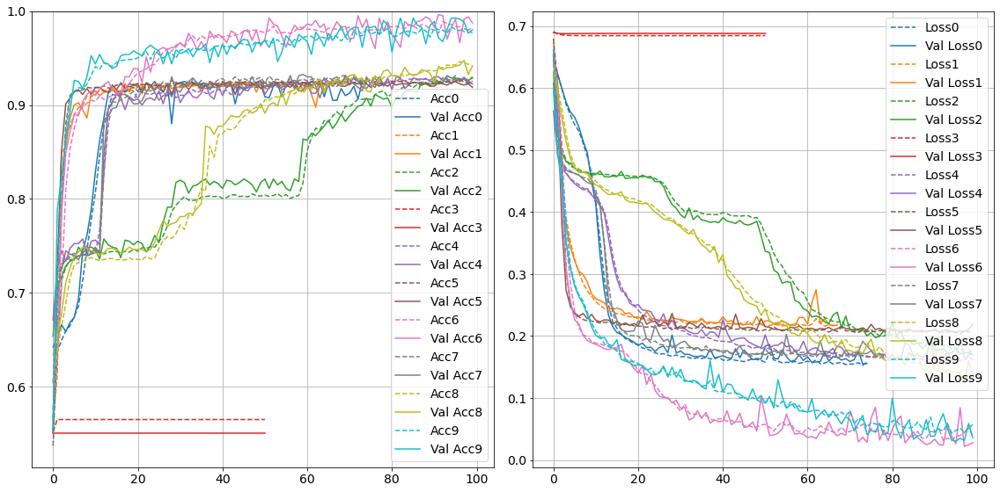

Standarized


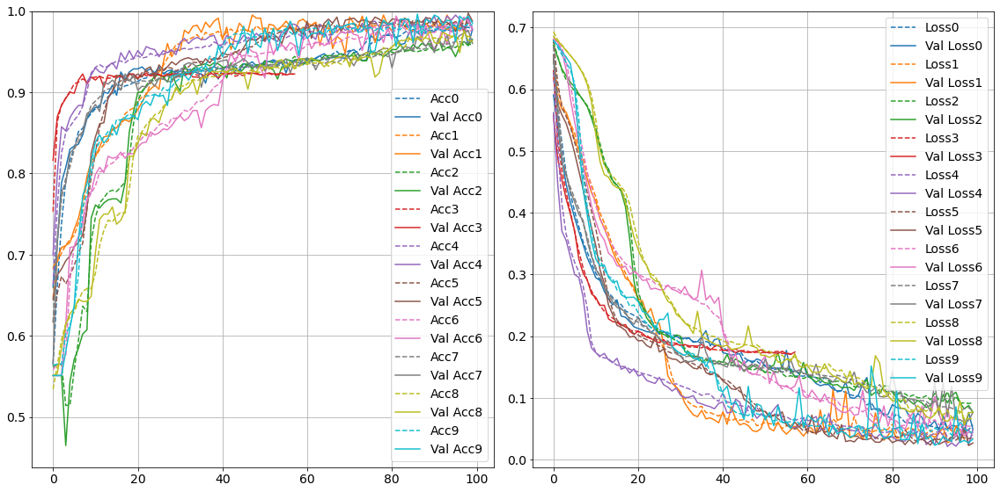

In [55]:
best_acc_norm = np.zeros((N_check))
best_acc_st = np.zeros((N_check))

for i in range(N_check):
    best_acc_norm[i] = np.max(fits_norm[i].history["val_accuracy"])
    best_acc_st[i] = np.max(fits_st[i].history["val_accuracy"])
    # print(best_acc[i])


print("Normalized")
print(np.average(best_acc_norm))
plot_fit_series(fits_norm,range(N_check),lambda x: f"{x}")
print("Standarized")
print(np.average(best_acc_st))
plot_fit_series(fits_st,range(N_check),lambda x: f"{x}")


## Different initialization

In [64]:
N_train = 3200
N_valid = 800
hidden_layers = 4
number_of_nodes = 10
activation = 'relu'
dropout = 0
es_acc = EarlyStopping(monitor="val_accuracy",patience=50,mode='max',min_delta=2/N_valid)
epochs = 100
batch_size = 16
N_check = 10
optimizer = "Adam"


x_train,y_train,x_valid,y_valid = create_datasets(N_train=N_train,N_valid = N_valid)

model = create_model(dropout=dropout,
        hidden_layers=hidden_layers,
        number_of_nodes=number_of_nodes,
        activation_hidden_layers=activation,
)


model_alt = Sequential()
model_alt.add(Dense(L,input_shape=(L,),
activation = 'relu',
kernel_initializer=HeNormal()
)
)
for i in range(hidden_layers):
    model_alt.add(Dense(number_of_nodes,activation=activation,
    kernel_initializer=HeNormal()
    )
    )
    model_alt.add(Dropout(dropout))
model_alt.add(Dense(1,activation='sigmoid'))
model_alt.compile(loss= 'binary_crossentropy',
optimizer = optimizer,
metrics = ['accuracy'])


fits_norm = []
fits_st = []
for n in range(N_check):
    model = create_model(dropout=dropout,
        hidden_layers=hidden_layers,
        number_of_nodes=number_of_nodes,
        activation_hidden_layers=activation,
        )
    model.load_weights(weights_file(n))
    
    fits_norm.append(model.fit(
        x_train_norm,y_train,
        epochs = epochs,
        batch_size = batch_size,
        validation_data=(x_valid_norm,y_valid),
        callbacks = [es_acc],
        verbose = 0
    ))
    model.load_weights(weights_file(n))
    
    fits_st.append(model.fit(
        x_train_st,y_train,
        epochs = epochs,
        batch_size = batch_size,
        validation_data=(x_valid_st,y_valid),
        callbacks = [es_acc],
        verbose = 0
    ))

Normalized
0.5658750057220459


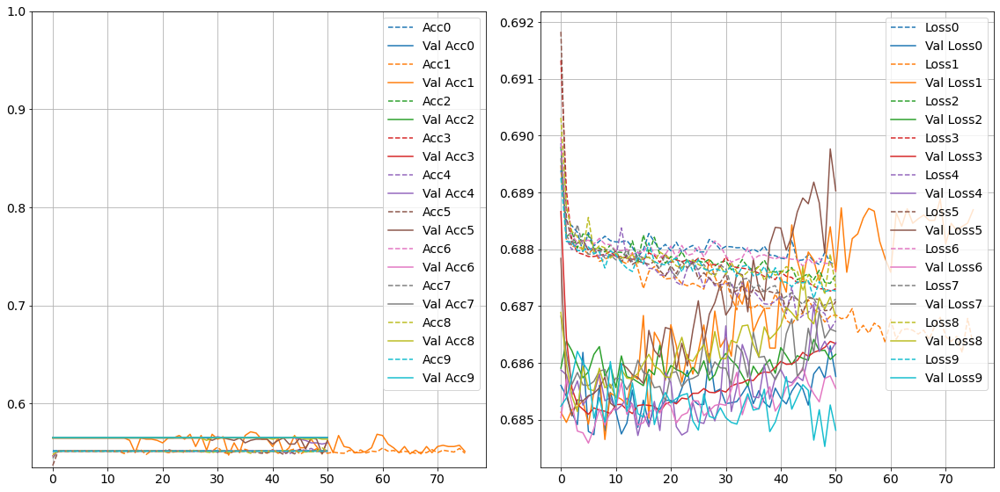

Standarized
0.5671249985694885


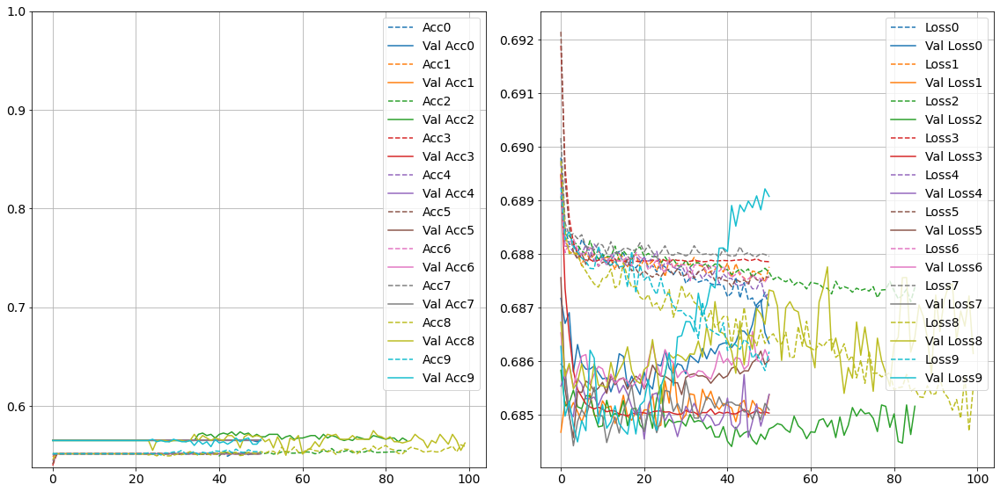

In [65]:
best_acc_norm = np.zeros((N_check))
best_acc_st = np.zeros((N_check))

for i in range(N_check):
    best_acc_norm[i] = np.max(fits_norm[i].history["val_accuracy"])
    best_acc_st[i] = np.max(fits_st[i].history["val_accuracy"])
    # print(best_acc[i])


print("Normalized")
print(np.average(best_acc_norm))
plot_fit_series(fits_norm,range(N_check),lambda x: f"{x}")
print("Standarized")
print(np.average(best_acc_st))
plot_fit_series(fits_st,range(N_check),lambda x: f"{x}")
